In [1]:
%run "la_00.ipynb"

In [2]:
def get_native_position(gene, pseudoposition):
    all_genes = ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']
    gene_index = dict(zip(all_genes, range(4)))
    return pseudopos_to_nativepos[pseudoposition][gene_index[gene]]

def get_native_aa(gene, pseudoposition):
    all_genes = ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']
    gene_index = dict(zip(all_genes, range(4)))
    return pseudopos_to_nativeaa[pseudoposition][gene_index[gene]]

def get_PDB_position(gene, pseudoposition):
    all_genes = ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']
    gene_structures = ['2wur.pdb', 'amacGFP_prediction.pdb', '2hpw.pdb', '2g3o.pdb']
    gene_index = dict(zip(all_genes, range(4)))
    gene_coefficients = dict(zip(all_genes, [1,1,1,1])) # shifts to add to native positions to get PDB numbering
    return pseudopos_to_nativepos[pseudoposition][gene_index[gene]] + gene_coefficients[gene]

def PDB_to_pseudo_position(gene, pdbposition):
    all_genes = ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']
    gene_structures = ['2wur.pdb', 'amacGFP_prediction.pdb', '2hpw.pdb', '2g3o.pdb']
    gene_index = dict(zip(all_genes, range(4)))
    gene_coefficients = dict(zip(all_genes, [1,1,1,1])) # shifts to add to native positions to get PDB numbering
    return nativepos_to_pseudopos[pdbposition][gene_index[gene]] - gene_coefficients[gene]

gene_structures = dict(zip(['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP'], 
                      ['2wur.pdb', 'amacGFP_prediction.pdb', '2hpw.pdb', '2g3o.pdb']))

In [3]:
by_nt_upd

,Unnamed: 0,nt_genotype,gene,aa_genotype_pseudo,total_cell_count,n_replicates,replicates_stdev_weighted,replicates_mean_brightness,index_of_dispersion,coefficient_of_variation,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev,aa_genotype_native
0,0,A100C,amacGFP,E36A,165.00,13.0,1059.270957,9890.458378,113.448226,0.107100,NaN,NaN,NaN,NaN,E33A
1,1,A100C:A144T:C172A,amacGFP,E36A:T51S:P60H,30.97,2.0,106.887117,244.496125,46.728167,0.437173,NaN,NaN,NaN,NaN,E33A:T48S:P57H
2,2,A100C:A304C:A436C:T452C:T532C:C566T,amacGFP,E36A:D105A:N149T:L181P,53.61,5.0,289.737621,2482.724391,33.812810,0.116701,NaN,NaN,NaN,NaN,E33A:D101A:N145T:L177P
3,3,A100C:A349T,amacGFP,E36A:D120V,39.33,2.0,339.869768,9488.274423,12.174127,0.035820,NaN,NaN,NaN,NaN,E33A:D116V
4,4,A100C:A489T:T667C:G681T,amacGFP,E36A:N167Y:F230S:G235W,72.07,6.0,772.824837,6390.797011,93.455985,0.120928,NaN,NaN,NaN,NaN,E33A:N163Y:F222S:G227W
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126561,125673,T661C:C662G:G663C:C664A:A665T:T666G:G667A:A668T,ppluGFP,F240S:A241H:*246D,112.07,6.0,875.145638,25428.434250,30.119034,0.034416,NaN,NaN,NaN,NaN,F220S:A221H:*222D
126562,125679,T666A:G667T:A668G,ppluGFP,*246M,132.15,8.0,1199.467386,15983.172132,90.014798,0.075046,NaN,NaN,NaN,NaN,*222M
126563,125682,T666C,ppluGFP,*246R,756.39,31.0,2435.088387,17816.379818,332.820445,0.136677,NaN,NaN,NaN,NaN,*222R
126564,125686,T666G,ppluGFP,*246G,491.92,34.0,2395.264114,17325.780293,331.141806,0.138249,NaN,NaN,NaN,NaN,*222G


In [4]:
by_nt_upd['replicates_mean_brightness'] = by_nt_upd['replicates_mean_brightness'].apply(np.log10)
by_nt_upd

,Unnamed: 0,nt_genotype,gene,aa_genotype_pseudo,total_cell_count,n_replicates,replicates_stdev_weighted,replicates_mean_brightness,index_of_dispersion,coefficient_of_variation,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev,aa_genotype_native
0,0,A100C,amacGFP,E36A,165.00,13.0,1059.270957,3.995216,113.448226,0.107100,NaN,NaN,NaN,NaN,E33A
1,1,A100C:A144T:C172A,amacGFP,E36A:T51S:P60H,30.97,2.0,106.887117,2.388272,46.728167,0.437173,NaN,NaN,NaN,NaN,E33A:T48S:P57H
2,2,A100C:A304C:A436C:T452C:T532C:C566T,amacGFP,E36A:D105A:N149T:L181P,53.61,5.0,289.737621,3.394929,33.812810,0.116701,NaN,NaN,NaN,NaN,E33A:D101A:N145T:L177P
3,3,A100C:A349T,amacGFP,E36A:D120V,39.33,2.0,339.869768,3.977187,12.174127,0.035820,NaN,NaN,NaN,NaN,E33A:D116V
4,4,A100C:A489T:T667C:G681T,amacGFP,E36A:N167Y:F230S:G235W,72.07,6.0,772.824837,3.805555,93.455985,0.120928,NaN,NaN,NaN,NaN,E33A:N163Y:F222S:G227W
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126561,125673,T661C:C662G:G663C:C664A:A665T:T666G:G667A:A668T,ppluGFP,F240S:A241H:*246D,112.07,6.0,875.145638,4.405320,30.119034,0.034416,NaN,NaN,NaN,NaN,F220S:A221H:*222D
126562,125679,T666A:G667T:A668G,ppluGFP,*246M,132.15,8.0,1199.467386,4.203663,90.014798,0.075046,NaN,NaN,NaN,NaN,*222M
126563,125682,T666C,ppluGFP,*246R,756.39,31.0,2435.088387,4.250819,332.820445,0.136677,NaN,NaN,NaN,NaN,*222R
126564,125686,T666G,ppluGFP,*246G,491.92,34.0,2395.264114,4.238693,331.141806,0.138249,NaN,NaN,NaN,NaN,*222G


In [5]:
#Take the gene names of the dataset

genes = sorted(set(by_nt_upd.gene))

genes

['amacGFP', 'cgreGFP', 'ppluGFP']

In [6]:
#Calculate the brightness of the wildtype genes

wt_brightness = {}
for gene in genes:
    wt = by_nt_upd[(by_nt_upd['gene']== gene) & (by_nt_upd['nt_genotype']=='wt')]
    wt_brightness[gene] = wt['replicates_mean_brightness'].median()
    
wt_brightness

{'amacGFP': 3.9759417642196695,
 'cgreGFP': 4.494366479589088,
 'ppluGFP': 4.2269429241006415}

In [7]:
#Create a new dataset which will be sorted by gene, amino acid genotype and nucleotide genotype

aa_mut = by_nt_upd.groupby(['gene','aa_genotype_pseudo', 'aa_genotype_native','nt_genotype']).agg({
                         'total_cell_count': np.sum, 'n_replicates': np.sum, 
                         'replicates_mean_brightness': np.median, 
                        'ddG_monomer': np.median, 'ddG_monomer_stdev': np.median,
                        'ddG_dimer': np.median, 'ddG_dimer_stdev': np.median})
aa_mut.reset_index(inplace=True)

aa_mut

,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev
0,amacGFP,*246G,*238G,A461C:T714G,53.70,6.0,3.966691,NaN,NaN,NaN,NaN
1,amacGFP,*246G,*238G,A461T:T714G,173.12,12.0,3.989159,NaN,NaN,NaN,NaN
2,amacGFP,*246G,*238G,C131A:T714G,39.57,2.0,3.956547,NaN,NaN,NaN,NaN
3,amacGFP,*246G,*238G,C347A:T714G,64.67,5.0,3.924950,NaN,NaN,NaN,NaN
4,amacGFP,*246G,*238G,C579T:T714G,33.31,4.0,4.059697,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
126561,ppluGFP,wt,wt,T659A,2550.52,100.0,4.229176,NaN,NaN,NaN,NaN
126562,ppluGFP,wt,wt,T659A:C662T,241.75,6.0,4.241842,NaN,NaN,NaN,NaN
126563,ppluGFP,wt,wt,T659C,3953.45,174.0,4.227871,NaN,NaN,NaN,NaN
126564,ppluGFP,wt,wt,T659G,1991.66,49.0,4.225663,NaN,NaN,NaN,NaN


In [8]:
aa_mut_amacGFP = aa_mut[aa_mut.gene=='amacGFP']
aa_mut_amacGFP.reset_index(inplace=True)

aa_mut_amacGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev
0,0,amacGFP,*246G,*238G,A461C:T714G,53.70,6.0,3.966691,NaN,NaN,NaN,NaN
1,1,amacGFP,*246G,*238G,A461T:T714G,173.12,12.0,3.989159,NaN,NaN,NaN,NaN
2,2,amacGFP,*246G,*238G,C131A:T714G,39.57,2.0,3.956547,NaN,NaN,NaN,NaN
3,3,amacGFP,*246G,*238G,C347A:T714G,64.67,5.0,3.924950,NaN,NaN,NaN,NaN
4,4,amacGFP,*246G,*238G,C579T:T714G,33.31,4.0,4.059697,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
45618,45618,amacGFP,wt,wt,T689C,1612.56,112.0,3.973505,NaN,NaN,NaN,NaN
45619,45619,amacGFP,wt,wt,T689C:C705T,57.37,7.0,3.981512,NaN,NaN,NaN,NaN
45620,45620,amacGFP,wt,wt,T689G,203.89,11.0,4.006488,NaN,NaN,NaN,NaN
45621,45621,amacGFP,wt,wt,T689G:C710T,71.84,2.0,4.024163,NaN,NaN,NaN,NaN


In [9]:
aa_mut_amacGFP=aa_mut_amacGFP[~aa_mut_amacGFP.aa_genotype_pseudo.str.contains("V14L", na=False)]
aa_mut_amacGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev
0,0,amacGFP,*246G,*238G,A461C:T714G,53.70,6.0,3.966691,NaN,NaN,NaN,NaN
1,1,amacGFP,*246G,*238G,A461T:T714G,173.12,12.0,3.989159,NaN,NaN,NaN,NaN
2,2,amacGFP,*246G,*238G,C131A:T714G,39.57,2.0,3.956547,NaN,NaN,NaN,NaN
3,3,amacGFP,*246G,*238G,C347A:T714G,64.67,5.0,3.924950,NaN,NaN,NaN,NaN
4,4,amacGFP,*246G,*238G,C579T:T714G,33.31,4.0,4.059697,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
45618,45618,amacGFP,wt,wt,T689C,1612.56,112.0,3.973505,NaN,NaN,NaN,NaN
45619,45619,amacGFP,wt,wt,T689C:C705T,57.37,7.0,3.981512,NaN,NaN,NaN,NaN
45620,45620,amacGFP,wt,wt,T689G,203.89,11.0,4.006488,NaN,NaN,NaN,NaN
45621,45621,amacGFP,wt,wt,T689G:C710T,71.84,2.0,4.024163,NaN,NaN,NaN,NaN


In [10]:
mean_bright_amacGFP = aa_mut_amacGFP['replicates_mean_brightness'].median()
mean_bright_amacGFP

3.892728741816545

In [11]:
#aa_mut_amacGFP['replicates_mean_brightness'] = aa_mut_amacGFP['replicates_mean_brightness']/7830.942491398344
#ben_mut_amacGFP = aa_mut_amacGFP.loc[aa_mut_amacGFP['replicates_mean_brightness'] >= 0.7]
ben_mut_amacGFP=aa_mut_amacGFP.copy()
ben_mut_amacGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev
0,0,amacGFP,*246G,*238G,A461C:T714G,53.70,6.0,3.966691,NaN,NaN,NaN,NaN
1,1,amacGFP,*246G,*238G,A461T:T714G,173.12,12.0,3.989159,NaN,NaN,NaN,NaN
2,2,amacGFP,*246G,*238G,C131A:T714G,39.57,2.0,3.956547,NaN,NaN,NaN,NaN
3,3,amacGFP,*246G,*238G,C347A:T714G,64.67,5.0,3.924950,NaN,NaN,NaN,NaN
4,4,amacGFP,*246G,*238G,C579T:T714G,33.31,4.0,4.059697,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
45618,45618,amacGFP,wt,wt,T689C,1612.56,112.0,3.973505,NaN,NaN,NaN,NaN
45619,45619,amacGFP,wt,wt,T689C:C705T,57.37,7.0,3.981512,NaN,NaN,NaN,NaN
45620,45620,amacGFP,wt,wt,T689G,203.89,11.0,4.006488,NaN,NaN,NaN,NaN
45621,45621,amacGFP,wt,wt,T689G:C710T,71.84,2.0,4.024163,NaN,NaN,NaN,NaN


In [12]:
sum_mut = lambda s: (len(s)>0)*(len(s.split(':'))) if s!='wt' else 0
ben_mut_amacGFP['aa_mutnumber'] = ben_mut_amacGFP['aa_genotype_pseudo'].apply(sum_mut)
ben_mut_amacGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev,aa_mutnumber
0,0,amacGFP,*246G,*238G,A461C:T714G,53.70,6.0,3.966691,NaN,NaN,NaN,NaN,1
1,1,amacGFP,*246G,*238G,A461T:T714G,173.12,12.0,3.989159,NaN,NaN,NaN,NaN,1
2,2,amacGFP,*246G,*238G,C131A:T714G,39.57,2.0,3.956547,NaN,NaN,NaN,NaN,1
3,3,amacGFP,*246G,*238G,C347A:T714G,64.67,5.0,3.924950,NaN,NaN,NaN,NaN,1
4,4,amacGFP,*246G,*238G,C579T:T714G,33.31,4.0,4.059697,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
45618,45618,amacGFP,wt,wt,T689C,1612.56,112.0,3.973505,NaN,NaN,NaN,NaN,0
45619,45619,amacGFP,wt,wt,T689C:C705T,57.37,7.0,3.981512,NaN,NaN,NaN,NaN,0
45620,45620,amacGFP,wt,wt,T689G,203.89,11.0,4.006488,NaN,NaN,NaN,NaN,0
45621,45621,amacGFP,wt,wt,T689G:C710T,71.84,2.0,4.024163,NaN,NaN,NaN,NaN,0


In [13]:
ben_mut_amacGFP = ben_mut_amacGFP[ben_mut_amacGFP['aa_mutnumber'] <= 10]
ben_mut_amacGFP.aa_mutnumber.max()

10

In [14]:
ben_mut_amacGFP = ben_mut_amacGFP.loc[ben_mut_amacGFP['aa_genotype_pseudo'] != 'wt']
ben_mut_amacGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev,aa_mutnumber
0,0,amacGFP,*246G,*238G,A461C:T714G,53.70,6.0,3.966691,NaN,NaN,NaN,NaN,1
1,1,amacGFP,*246G,*238G,A461T:T714G,173.12,12.0,3.989159,NaN,NaN,NaN,NaN,1
2,2,amacGFP,*246G,*238G,C131A:T714G,39.57,2.0,3.956547,NaN,NaN,NaN,NaN,1
3,3,amacGFP,*246G,*238G,C347A:T714G,64.67,5.0,3.924950,NaN,NaN,NaN,NaN,1
4,4,amacGFP,*246G,*238G,C579T:T714G,33.31,4.0,4.059697,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
44529,44529,amacGFP,Y95N:M131T:D132G:A212V,Y91N:M127T:D128G:A205V,C116T:C200T:T273A:T382C:A385G:C616T,28.96,2.0,2.523686,NaN,NaN,NaN,NaN,4
44530,44530,amacGFP,Y95N:T111A,Y91N:T107A,T273A:A321G:C644T,35.77,4.0,2.528028,NaN,NaN,NaN,NaN,2
44531,44531,amacGFP,Y95S,Y91S,A274C,57.54,13.0,2.742189,NaN,NaN,NaN,NaN,1
44532,44532,amacGFP,Y95S:I203F,Y91S:I196F,A274C:A588T,30.33,2.0,3.570923,NaN,NaN,NaN,NaN,2


In [15]:
position_ben_sing_amacGFP = {}               

for index, row in ben_mut_amacGFP.iterrows(): 
        if ':' not in row["aa_genotype_pseudo"]:
            position_ben_sing_amacGFP[index] = row["aa_genotype_pseudo"]
            
position_ben_sing_amacGFP = pd.DataFrame.from_dict(position_ben_sing_amacGFP, orient='index')

position_ben_sing_amacGFP.columns=['aa_mutation']
position_ben_sing_amacGFP

,aa_mutation
0,*246G
1,*246G
2,*246G
3,*246G
4,*246G
...,...
44477,Y95F
44520,Y95H
44521,Y95H
44527,Y95N


In [16]:
position_ben_mult_amacGFP={}

for index, row in ben_mut_amacGFP.iterrows(): 
        if ':' in row["aa_genotype_pseudo"]:
            position_ben_mult_amacGFP[index] = (row["aa_genotype_pseudo"].split(":"))
            
position_ben_mult_amacGFP = pd.DataFrame.from_dict(position_ben_mult_amacGFP, orient='index')
position_ben_mult_amacGFP=position_ben_mult_amacGFP.stack()
position_ben_mult_amacGFP=pd.DataFrame(position_ben_mult_amacGFP)
position_ben_mult_amacGFP.columns=['aa_mutation']
position_ben_mult_amacGFP = position_ben_mult_amacGFP.reset_index()
position_ben_mult_amacGFP=position_ben_mult_amacGFP.drop(['level_0', 'level_1'], axis=1)

position_ben_mult_amacGFP

,aa_mutation
0,A160D
1,F230L
2,A160D
3,G176R
4,A160D
...,...
63412,Y95S
63413,K129M
63414,D136G
63415,M156I


In [17]:
ben_frames = [position_ben_mult_amacGFP,position_ben_mult_amacGFP]
position_ben_amacGFP = pd.concat(ben_frames)

In [18]:
mut_unique_amac = position_ben_amacGFP.aa_mutation.unique()
mut_unique_amac = np.ndarray.tolist(mut_unique_amac)
mut_unique_amac

['A160D',
 'F230L',
 'G176R',
 'H224N',
 'I203T',
 'H236Y',
 'K169M',
 'K245R',
 'L164M',
 'F231I',
 'L228M',
 'N161D',
 'G178W',
 'I198V',
 'F227L',
 'N204I',
 'P190S',
 'V196A',
 'T211A',
 'V179A',
 'A160G',
 'K165R',
 'G178V',
 'A160P',
 'A182S',
 'H238N',
 'A160S',
 'H172Q',
 'Q210L',
 'K245T',
 'P199L',
 'T187S',
 'N188Y',
 'E242V',
 'A160T',
 'C234S',
 'G235W',
 'K169E',
 'H238Q',
 'M240V',
 'L181H',
 'N167Y',
 'R222C',
 'V166A',
 'D223Y',
 'A160V',
 'D241N',
 'G163C',
 'L243P',
 'N218S',
 'R222H',
 'P199T',
 'Q180L',
 'Q210R',
 'C234R',
 'S208R',
 'K245I',
 'A212V',
 'H238L',
 'A182T',
 'D193G',
 'G239S',
 'M240T',
 'Y185F',
 'Y206C',
 'F231L',
 'A182V',
 'D183E',
 'D223E',
 'H224L',
 'E229G',
 'I203F',
 'M240I',
 'S214G',
 'M240L',
 'T187M',
 'T237N',
 'A212D',
 'G239D',
 'A212G',
 'A212S',
 'V226A',
 'A212T',
 'C234*',
 'D216E',
 'M225I',
 'T237A',
 'D216V',
 'S232C',
 'T221A',
 'T221S',
 'L243Q',
 'A233T',
 '*246W',
 'D241G',
 'A233V',
 'H238D',
 'A39D',
 'F102L',
 'Y185D',
 

In [19]:
print(type(mut_unique_amac))

<class 'list'>


In [20]:
all_mut_bac={}

for mutation in mut_unique_amac:
    mut_bac= ben_mut_amacGFP[ben_mut_amacGFP['aa_genotype_pseudo'].apply(lambda multi: mutation in multi.split(':'))]
    background = mut_bac['aa_genotype_pseudo'].apply(lambda nom: ':'.join([m for m in nom.split(':') if m != mutation]))
    mut_bac['mut_background']=background
    mut_bac['mutation'] = mutation
    mut_bac['bright_mutation'] = ben_mut_amacGFP[ben_mut_amacGFP['aa_genotype_pseudo']==mutation]['replicates_mean_brightness'].median()
    all_mut_bac[mutation]=mut_bac
    
all_mut_bac

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

{'A160D':        index     gene                           aa_genotype_pseudo  \
 14        14  amacGFP                                        A160D   
 15        15  amacGFP                                        A160D   
 16        16  amacGFP                                        A160D   
 17        17  amacGFP                                        A160D   
 18        18  amacGFP                                  A160D:F230L   
 19        19  amacGFP                                  A160D:G176R   
 20        20  amacGFP                                  A160D:H224N   
 21        21  amacGFP                            A160D:I203T:H236Y   
 22        22  amacGFP                                  A160D:K169M   
 23        23  amacGFP                                  A160D:K245R   
 24        24  amacGFP                            A160D:L164M:F231I   
 25        25  amacGFP                                  A160D:L228M   
 26        26  amacGFP                A160D:N161D:G178W:I198V:F227L 

In [21]:
dict_of_df = {k:pd.DataFrame(v) for k,v in all_mut_bac.items()}
df_bis=pd.concat(dict_of_df,axis=0)

In [22]:
df_bis =df_bis.drop(columns=['nt_genotype', 'total_cell_count','n_replicates','ddG_monomer',
                            'ddG_monomer_stdev','ddG_dimer','ddG_dimer_stdev'])
df_bis

index     gene                  aa_genotype_pseudo  \
A160D 14        14  amacGFP                               A160D   
      15        15  amacGFP                               A160D   
      16        16  amacGFP                               A160D   
      17        17  amacGFP                               A160D   
      18        18  amacGFP                         A160D:F230L   
...            ...      ...                                 ...   
Y41T  44199  44199  amacGFP   Y41T:V63A:E114D:A160S:I213V:E229G   
C234P 44326  44326  amacGFP  Y68H:N124S:M131V:Q210R:C234P:E242V   
V115G 44336  44336  amacGFP                          Y68H:V115G   
E242W 44355  44355  amacGFP   Y68N:E93V:S214T:T221A:H238D:E242W   
Y76*  44393  44393  amacGFP              Y76*:F103Y:G137D:V189D   

                             aa_genotype_native  replicates_mean_brightness  \
A160D 14                                  A156D                    3.939211   
      15                                  A156D                    3.979926   
      16                                  A156D                    3.972213   
      17                                  A156D                    3.975060   
      18                            A156D:F222L                    3.935258   
...                                         ...                         ...   
Y41T  44199   Y38T:V60A:E110D:A156S:I206V:E221G                    2.388752   
C234P 44326  Y65H:N120S:M127V:Q203R:C226P:E234V                    2.335328   
V115G 44336                          Y65H:V111G                    2.231866   
E242W 44355   Y65N:E89V:S207T:T213A:H230D:E234W                    2.260643   
Y76*  44393               Y73*:F99Y:G133D:V185D                    3.894810   

             aa_mutnumber                mut_background mutation  \
A160D 14                1                                  A160D   
      15                1                                  A160D   
      16                1                                  A160D   
      17                1                                  A160D   
      18                2                         F230L    A160D   
...                   ...                           ...      ...   
Y41T  44199             6  V63A:E114D:A160S:I213V:E229G     Y41T   
C234P 44326             6  Y68H:N124S:M131V:Q210R:E242V    C234P   
V115G 44336             2                          Y68H    V115G   
E242W 44355             6   Y68N:E93V:S214T:T221A:H238D    E242W   
Y76*  44393             4             F103Y:G137D:V189D     Y76*   

             bright_mutation  
A160D 14            3.973636  
      15            3.973636  
      16            3.973636  
      17            3.973636  
      18            3.973636  
...                      ...  
Y41T  44199              NaN  
C234P 44326              NaN  
V115G 44336              NaN  
E242W 44355              NaN  
Y76*  44393              NaN  

[69745 rows x 9 columns]

In [23]:
print(type(df_bis))

<class 'pandas.core.frame.DataFrame'>


In [24]:
filter = df_bis["mut_background"] != ""
dfNew = df_bis[filter]
dfNew

index     gene                  aa_genotype_pseudo  \
A160D 18        18  amacGFP                         A160D:F230L   
      19        19  amacGFP                         A160D:G176R   
      20        20  amacGFP                         A160D:H224N   
      21        21  amacGFP                   A160D:I203T:H236Y   
      22        22  amacGFP                         A160D:K169M   
...            ...      ...                                 ...   
Y41T  44199  44199  amacGFP   Y41T:V63A:E114D:A160S:I213V:E229G   
C234P 44326  44326  amacGFP  Y68H:N124S:M131V:Q210R:C234P:E242V   
V115G 44336  44336  amacGFP                          Y68H:V115G   
E242W 44355  44355  amacGFP   Y68N:E93V:S214T:T221A:H238D:E242W   
Y76*  44393  44393  amacGFP              Y76*:F103Y:G137D:V189D   

                             aa_genotype_native  replicates_mean_brightness  \
A160D 18                            A156D:F222L                    3.935258   
      19                            A156D:G172R                    3.966105   
      20                            A156D:H216N                    3.953688   
      21                      A156D:I196T:H228Y                    4.002990   
      22                            A156D:K165M                    3.938181   
...                                         ...                         ...   
Y41T  44199   Y38T:V60A:E110D:A156S:I206V:E221G                    2.388752   
C234P 44326  Y65H:N120S:M127V:Q203R:C226P:E234V                    2.335328   
V115G 44336                          Y65H:V111G                    2.231866   
E242W 44355   Y65N:E89V:S207T:T213A:H230D:E234W                    2.260643   
Y76*  44393               Y73*:F99Y:G133D:V185D                    3.894810   

             aa_mutnumber                mut_background mutation  \
A160D 18                2                         F230L    A160D   
      19                2                         G176R    A160D   
      20                2                         H224N    A160D   
      21                3                   I203T:H236Y    A160D   
      22                2                         K169M    A160D   
...                   ...                           ...      ...   
Y41T  44199             6  V63A:E114D:A160S:I213V:E229G     Y41T   
C234P 44326             6  Y68H:N124S:M131V:Q210R:E242V    C234P   
V115G 44336             2                          Y68H    V115G   
E242W 44355             6   Y68N:E93V:S214T:T221A:H238D    E242W   
Y76*  44393             4             F103Y:G137D:V189D     Y76*   

             bright_mutation  
A160D 18            3.973636  
      19            3.973636  
      20            3.973636  
      21            3.973636  
      22            3.973636  
...                      ...  
Y41T  44199              NaN  
C234P 44326              NaN  
V115G 44336              NaN  
E242W 44355              NaN  
Y76*  44393              NaN  

[63417 rows x 9 columns]

In [25]:
dfNew =dfNew.drop(columns=['index'])
dfNew=dfNew.reset_index(level=0, drop=True)
dfNew=dfNew.reset_index(drop=True)
dfNew =dfNew.dropna()

dfNew

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation
0,amacGFP,A160D:F230L,A156D:F222L,3.935258,2,F230L,A160D,3.973636
1,amacGFP,A160D:G176R,A156D:G172R,3.966105,2,G176R,A160D,3.973636
2,amacGFP,A160D:H224N,A156D:H216N,3.953688,2,H224N,A160D,3.973636
3,amacGFP,A160D:I203T:H236Y,A156D:I196T:H228Y,4.002990,3,I203T:H236Y,A160D,3.973636
4,amacGFP,A160D:K169M,A156D:K165M,3.938181,2,K169M,A160D,3.973636
...,...,...,...,...,...,...,...,...
63391,amacGFP,V16F:K54R,V13F:K51R,3.565526,2,K54R,V16F,3.590013
63392,amacGFP,V16F:L17R,V13F:L14R,3.613649,2,L17R,V16F,3.590013
63393,amacGFP,V16F:Y41H:E242K,V13F:Y38H:E234K,3.358990,3,Y41H:E242K,V16F,3.590013
63394,amacGFP,V16F:Y41H:I198L,V13F:Y38H:I194L,3.420978,3,Y41H:I198L,V16F,3.590013


In [26]:
background=dfNew.mut_background
background

0              F230L
1              G176R
2              H224N
3        I203T:H236Y
4              K169M
            ...     
63391           K54R
63392           L17R
63393     Y41H:E242K
63394     Y41H:I198L
63395     Y68H:F227L
Name: mut_background, Length: 61795, dtype: object

In [27]:
mut_bac = {}
for bac in background:
    bright = ben_mut_amacGFP[ben_mut_amacGFP['aa_genotype_pseudo']== bac]
    mut_bac[bac] = bright['replicates_mean_brightness'].median()
    
mut_bac

{'F230L': 3.910730991148703,
 'G176R': nan,
 'H224N': 4.100390517107432,
 'I203T:H236Y': nan,
 'K169M': 3.9680477371481366,
 'K245R': 3.9705255674026563,
 'L164M:F231I': nan,
 'L228M': 3.882480933533155,
 'N161D:G178W:I198V:F227L': nan,
 'N204I': 3.9192449273633567,
 'P190S:V196A': nan,
 'T211A': 3.182255496091154,
 'V179A': 3.854557705926981,
 'C72G:F148L': nan,
 'D21V:A74T:P195H:D241E': nan,
 'E118D:S150G:I174T': nan,
 'E118K': 3.9667068305275883,
 'E145D:N161D': nan,
 'E145G:K159N:F227Y': nan,
 'E34V:M80V:V166A': nan,
 'E36K:N138S:S150G': nan,
 'E45G:K108R': nan,
 'E8A:E127V:H238N': nan,
 'F103L:G137S:C234S': nan,
 'F10I:T52S:I70L:K81M:M156I:V189D:N204S': nan,
 'F148L:R217S': nan,
 'F48L:K143M:K169R': nan,
 'F48Y:M80I:K81R:F117L': nan,
 'G53D:N162S:D241G': nan,
 'H79L:K134N:N173I:T221I': nan,
 'I96F:R99L:N162I:A233D': nan,
 'K129R:D158E': nan,
 'K2*:K54*:K159*': nan,
 'K28E:D132G': nan,
 'K54M:H172L': nan,
 'L62I:V226D': nan,
 'L66V:Y68N:K169E:H238N': nan,
 'L9M:E118V:S232R': nan,
 

In [28]:
mut_bac = pd.DataFrame.from_dict(mut_bac, orient='index')

mut_bac

,0
F230L,3.910731
G176R,NaN
H224N,4.100391
I203T:H236Y,NaN
K169M,3.968048
...,...
E135V:D241Y,NaN
K169M:G239S,NaN
Y41H:E242K,NaN
Y41H:I198L,NaN


In [29]:
mut_bac.columns =['bright_background']
mut_bac = mut_bac.rename_axis('mut_background').reset_index()

mut_bac

,mut_background,bright_background
0,F230L,3.910731
1,G176R,NaN
2,H224N,4.100391
3,I203T:H236Y,NaN
4,K169M,3.968048
...,...,...
41303,E135V:D241Y,NaN
41304,K169M:G239S,NaN
41305,Y41H:E242K,NaN
41306,Y41H:I198L,NaN


In [30]:
dfNew_bis = pd.merge(dfNew, mut_bac, on='mut_background')

dfNew_bis

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background
0,amacGFP,A160D:F230L,A156D:F222L,3.935258,2,F230L,A160D,3.973636,3.910731
1,amacGFP,V196A:F230L,V192A:F222L,3.906923,2,F230L,V196A,3.956355,3.910731
2,amacGFP,G178V:F230L,G174V:F222L,4.011260,2,F230L,G178V,4.048480,3.910731
3,amacGFP,F230L:E242V,F222L:E234V,3.875864,2,F230L,E242V,3.969486,3.910731
4,amacGFP,Q210R:F230L,Q203R:F222L,4.015775,2,F230L,Q210R,4.030573,3.910731
...,...,...,...,...,...,...,...,...,...
61790,amacGFP,V14W:E135V:D241Y,V11W:E131V:D233Y,3.751475,3,E135V:D241Y,V14W,3.818196,NaN
61791,amacGFP,V16F:K169M:G239S,V13F:K165M:G231S,3.568322,3,K169M:G239S,V16F,3.590013,NaN
61792,amacGFP,V16F:Y41H:E242K,V13F:Y38H:E234K,3.358990,3,Y41H:E242K,V16F,3.590013,NaN
61793,amacGFP,V16F:Y41H:I198L,V13F:Y38H:I194L,3.420978,3,Y41H:I198L,V16F,3.590013,NaN


In [31]:
dfNew =dfNew_bis.dropna()

dfNew

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background
0,amacGFP,A160D:F230L,A156D:F222L,3.935258,2,F230L,A160D,3.973636,3.910731
1,amacGFP,V196A:F230L,V192A:F222L,3.906923,2,F230L,V196A,3.956355,3.910731
2,amacGFP,G178V:F230L,G174V:F222L,4.011260,2,F230L,G178V,4.048480,3.910731
3,amacGFP,F230L:E242V,F222L:E234V,3.875864,2,F230L,E242V,3.969486,3.910731
4,amacGFP,Q210R:F230L,Q203R:F222L,4.015775,2,F230L,Q210R,4.030573,3.910731
...,...,...,...,...,...,...,...,...,...
61553,amacGFP,V16I:L71V:F231L,V13I:L68V:F223L,3.519812,3,V16I:F231L,L71V,4.038613,3.791037
61594,amacGFP,S1C:D84H,S1C:D81H,3.167519,2,D84H,S1C,3.974912,3.033512
61595,amacGFP,S1C:E175Q:I198N,S1C:E171Q:I194N,3.912066,3,E175Q:I198N,S1C,3.974912,3.926036
61683,amacGFP,S1G:N161Y:M240V,S1G:N157Y:M232V,3.913322,3,N161Y:M240V,S1G,3.982899,3.890429


In [32]:
dfNew = dfNew.loc[dfNew['bright_background'] >= (0.7*3.9759417642196695)]#0.9616557033424279)]

In [33]:
dfNew['ones'] = 1

dfNew['bac_num']=""

for index, row in dfNew.iterrows():
    pos= row['mutation']
    dfNew['bac_num'][index] = dfNew[dfNew['mutation']==pos].ones.sum()

dfNew = dfNew.sort_values(['bac_num'],ascending=False)
dfNew

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fr

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num
17203,amacGFP,S150C:H238N,S146C:H230N,3.972274,2,S150C,H238N,3.975627,3.967929,1,399
1939,amacGFP,V16I:H238N,V13I:H230N,3.958074,2,V16I,H238N,3.975627,3.975899,1,399
3358,amacGFP,V14A:H238N,V11A:H230N,3.929080,2,V14A,H238N,3.975627,3.926492,1,399
16365,amacGFP,L164M:H238N,L160M:H230N,3.407406,2,L164M,H238N,3.975627,3.384472,1,399
16352,amacGFP,L144M:H238N,L140M:H230N,4.006078,2,L144M,H238N,3.975627,4.027638,1,399
...,...,...,...,...,...,...,...,...,...,...,...
2066,amacGFP,V16I:P77L,V13I:P74L,3.650855,2,V16I,P77L,3.603748,3.975899,1,1
2067,amacGFP,V16I:L66V,V13I:L63V,3.958333,2,V16I,L66V,3.921878,3.975899,1,1
8211,amacGFP,D21V:R222P,D18V:R214P,3.765256,2,D21V,R222P,3.831158,3.972910,1,1
8210,amacGFP,D21V:P190A,D18V:P186A,3.935036,2,D21V,P190A,3.890524,3.972910,1,1


In [34]:
#Another way of doing it
#dfNew['ones']=1
#position=dfNew['mutation']
#sum_pos = {}
#for pos in position:
    #posit = dfNew[dfNew['mutation']== pos]
    #sum_pos[pos] = posit['ones'].sum()
    
#sum_pos = pd.DataFrame.from_dict(sum_pos, orient='index')
#sum_pos.columns =['bac_num']
#sum_pos = sum_pos.rename_axis('mutation').reset_index()
#dfNew = pd.merge(dfNew, sum_pos, on='mutation')
#dfNew = dfNew.sort_values(['bac_num'],ascending=False)
#dfNew

In [35]:
dfNew = dfNew.loc[dfNew['bac_num'] > 5]
dfNew

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num
17203,amacGFP,S150C:H238N,S146C:H230N,3.972274,2,S150C,H238N,3.975627,3.967929,1,399
1939,amacGFP,V16I:H238N,V13I:H230N,3.958074,2,V16I,H238N,3.975627,3.975899,1,399
3358,amacGFP,V14A:H238N,V11A:H230N,3.929080,2,V14A,H238N,3.975627,3.926492,1,399
16365,amacGFP,L164M:H238N,L160M:H230N,3.407406,2,L164M,H238N,3.975627,3.384472,1,399
16352,amacGFP,L144M:H238N,L140M:H230N,4.006078,2,L144M,H238N,3.975627,4.027638,1,399
...,...,...,...,...,...,...,...,...,...,...,...
25977,amacGFP,D105V:F231L:H238N,D101V:F223L:H230N,3.825995,3,F231L:H238N,D105V,3.906993,3.834317,1,6
17067,amacGFP,R112C:H184Q,R108C:H180Q,3.520978,2,R112C,H184Q,3.797950,3.933019,1,6
14250,amacGFP,D216G:R217L,D209G:R210L,3.911062,2,D216G,R217L,3.924835,3.881296,1,6
27082,amacGFP,D106E:K134M,D102E:K130M,3.916488,2,K134M,D106E,3.924105,3.952546,1,6


In [36]:
dfNew['bright_context'] = dfNew['replicates_mean_brightness'] - dfNew['bright_background']
dfNew

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num,bright_context
17203,amacGFP,S150C:H238N,S146C:H230N,3.972274,2,S150C,H238N,3.975627,3.967929,1,399,0.004345
1939,amacGFP,V16I:H238N,V13I:H230N,3.958074,2,V16I,H238N,3.975627,3.975899,1,399,-0.017825
3358,amacGFP,V14A:H238N,V11A:H230N,3.929080,2,V14A,H238N,3.975627,3.926492,1,399,0.002588
16365,amacGFP,L164M:H238N,L160M:H230N,3.407406,2,L164M,H238N,3.975627,3.384472,1,399,0.022934
16352,amacGFP,L144M:H238N,L140M:H230N,4.006078,2,L144M,H238N,3.975627,4.027638,1,399,-0.021561
...,...,...,...,...,...,...,...,...,...,...,...,...
25977,amacGFP,D105V:F231L:H238N,D101V:F223L:H230N,3.825995,3,F231L:H238N,D105V,3.906993,3.834317,1,6,-0.008322
17067,amacGFP,R112C:H184Q,R108C:H180Q,3.520978,2,R112C,H184Q,3.797950,3.933019,1,6,-0.412041
14250,amacGFP,D216G:R217L,D209G:R210L,3.911062,2,D216G,R217L,3.924835,3.881296,1,6,0.029766
27082,amacGFP,D106E:K134M,D102E:K130M,3.916488,2,K134M,D106E,3.924105,3.952546,1,6,-0.036058


In [37]:
dfNew['position'] = dfNew['mutation'].str[1:-1].apply(int)
dfNew

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num,bright_context,position
17203,amacGFP,S150C:H238N,S146C:H230N,3.972274,2,S150C,H238N,3.975627,3.967929,1,399,0.004345,238
1939,amacGFP,V16I:H238N,V13I:H230N,3.958074,2,V16I,H238N,3.975627,3.975899,1,399,-0.017825,238
3358,amacGFP,V14A:H238N,V11A:H230N,3.929080,2,V14A,H238N,3.975627,3.926492,1,399,0.002588,238
16365,amacGFP,L164M:H238N,L160M:H230N,3.407406,2,L164M,H238N,3.975627,3.384472,1,399,0.022934,238
16352,amacGFP,L144M:H238N,L140M:H230N,4.006078,2,L144M,H238N,3.975627,4.027638,1,399,-0.021561,238
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25977,amacGFP,D105V:F231L:H238N,D101V:F223L:H230N,3.825995,3,F231L:H238N,D105V,3.906993,3.834317,1,6,-0.008322,105
17067,amacGFP,R112C:H184Q,R108C:H180Q,3.520978,2,R112C,H184Q,3.797950,3.933019,1,6,-0.412041,184
14250,amacGFP,D216G:R217L,D209G:R210L,3.911062,2,D216G,R217L,3.924835,3.881296,1,6,0.029766,217
27082,amacGFP,D106E:K134M,D102E:K130M,3.916488,2,K134M,D106E,3.924105,3.952546,1,6,-0.036058,106


In [38]:
dfNew_try = dfNew.copy()
dfNew_try['median']=""

for index, row in dfNew_try.iterrows():
    pos = row['mutation']
    dfNew_try['median'][index] = dfNew_try[dfNew_try['mutation']==pos].bright_context.median()

dfNew_try = dfNew_try.sort_values(['median'],ascending=False)
dfNew_try

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num,bright_context,position,median
2375,amacGFP,K47R:I170T,K44R:I166T,4.241395,2,K47R,I170T,4.246544,3.911168,1,31,0.330227,170,0.285801
5780,amacGFP,I170T:E175V,I166T:E171V,4.256126,2,E175V,I170T,4.246544,3.970325,1,31,0.285801,170,0.285801
21469,amacGFP,I170T:C234*,I166T:C226*,4.239430,2,C234*,I170T,4.246544,3.800838,1,31,0.438592,170,0.285801
14398,amacGFP,E114G:I170T,E110G:I166T,4.236494,2,E114G,I170T,4.246544,3.934746,1,31,0.301747,170,0.285801
13159,amacGFP,I170T:E242G,I166T:E234G,4.255352,2,E242G,I170T,4.246544,3.996752,1,31,0.258600,170,0.285801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11236,amacGFP,T64N:Q104K,T61N:Q100K,2.574985,2,Q104K,T64N,2.456872,3.929078,1,9,-1.354093,64,-1.72861
9930,amacGFP,T64N:M240V,T61N:M232V,2.426568,2,M240V,T64N,2.456872,3.993589,1,9,-1.567020,64,-1.72861
22584,amacGFP,T64N:K129M,T61N:K125M,1.995746,2,K129M,T64N,2.456872,3.945744,1,9,-1.949999,64,-1.72861
21805,amacGFP,T64N:K165N,T61N:K161N,2.232154,2,K165N,T64N,2.456872,3.960768,1,9,-1.728615,64,-1.72861


In [39]:
#Antoher way of doing it
#position=dfNew['mutation']
#med_pos = {}
#for pos in position:
    #posit = dfNew[dfNew['mutation']== pos]
    #med_pos[pos] = posit['bright_context'].median()
    
#med_pos = pd.DataFrame.from_dict(med_pos, orient='index')
#med_pos.columns =['median']
#med_pos = med_pos.rename_axis('mutation').reset_index()
#dfNew_fin= pd.merge(dfNew, med_pos, on='mutation')
#dfNew_fin = dfNew_fin.sort_values(['median'],ascending=False)

#dfNew_fin

In [40]:
dfNew_final = dfNew_try.copy()
dfNew_final.to_csv('amac_final.csv')

In [41]:
dfNew_thres=dfNew_final.copy()
dfNew_thres.loc[dfNew_thres['median']>=0.75, 'median']=0.75
dfNew_thres.loc[dfNew_thres['median']<=-0.75, 'median']=-0.75
dfNew_thres

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num,bright_context,position,median
2375,amacGFP,K47R:I170T,K44R:I166T,4.241395,2,K47R,I170T,4.246544,3.911168,1,31,0.330227,170,0.285801
5780,amacGFP,I170T:E175V,I166T:E171V,4.256126,2,E175V,I170T,4.246544,3.970325,1,31,0.285801,170,0.285801
21469,amacGFP,I170T:C234*,I166T:C226*,4.239430,2,C234*,I170T,4.246544,3.800838,1,31,0.438592,170,0.285801
14398,amacGFP,E114G:I170T,E110G:I166T,4.236494,2,E114G,I170T,4.246544,3.934746,1,31,0.301747,170,0.285801
13159,amacGFP,I170T:E242G,I166T:E234G,4.255352,2,E242G,I170T,4.246544,3.996752,1,31,0.258600,170,0.285801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11236,amacGFP,T64N:Q104K,T61N:Q100K,2.574985,2,Q104K,T64N,2.456872,3.929078,1,9,-1.354093,64,-0.75
9930,amacGFP,T64N:M240V,T61N:M232V,2.426568,2,M240V,T64N,2.456872,3.993589,1,9,-1.567020,64,-0.75
22584,amacGFP,T64N:K129M,T61N:K125M,1.995746,2,K129M,T64N,2.456872,3.945744,1,9,-1.949999,64,-0.75
21805,amacGFP,T64N:K165N,T61N:K161N,2.232154,2,K165N,T64N,2.456872,3.960768,1,9,-1.728615,64,-0.75


In [42]:
dfNew_thres.to_csv('amac_threshold.csv')

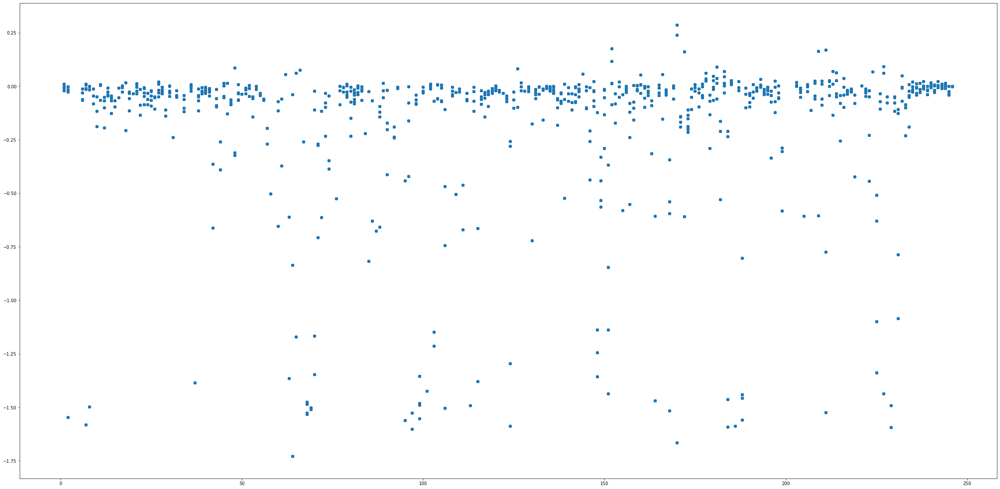

In [43]:
fig, ax = plt.subplots(figsize=(40,20))

bars1 = ax.scatter('position', 'median', data=dfNew_final)

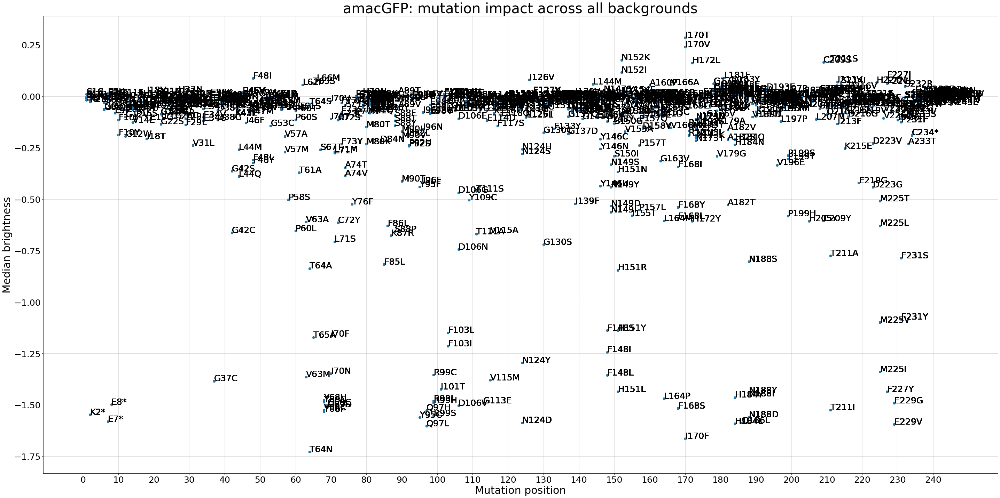

In [44]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'median', data=dfNew_final)
#ax.text('position', 'median', 'mutation', data=dfNew_fin, ha='left', color='grey', fontsize=10)
dfNew_final[['position', 'median', 'mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)

ax.set_ylabel('Median brightness', fontsize=30)
ax.set_xlabel('Mutation position', fontsize=30)
ax.set_title('amacGFP: mutation impact across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 250, step=10));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)



fig.tight_layout()

#plt.savefig('amac_bright_annot.png', dpi=300)

In [63]:
dfNew_finally=dfNew_final[['position', 'bright_context', 'median', 'mutation','bac_num']]
dfNew_threshold=dfNew_thres[['position', 'bright_context', 'median', 'mutation','bac_num']]

In [64]:
dfNew_finally['stdev']=""

for index, row in dfNew_finally.iterrows():
    pos = row['mutation']
    dfNew_finally['stdev'][index] = dfNew_finally[dfNew_finally['mutation']==pos].bright_context.std()

dfNew_finally = dfNew_finally.sort_values(['median'],ascending=False)
dfNew_finally

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\Elisenda\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

,position,bright_context,median,mutation,bac_num,stdev
2375,170,0.330227,0.285801,I170T,31,0.229443
18680,170,0.346446,0.285801,I170T,31,0.229443
5780,170,0.285801,0.285801,I170T,31,0.229443
30006,170,0.272001,0.285801,I170T,31,0.229443
12,170,0.303179,0.285801,I170T,31,0.229443
...,...,...,...,...,...,...
11236,64,-1.354093,-1.72861,T64N,9,0.181266
9930,64,-1.567020,-1.72861,T64N,9,0.181266
22584,64,-1.949999,-1.72861,T64N,9,0.181266
21805,64,-1.728615,-1.72861,T64N,9,0.181266


In [65]:
dfNew_threshold['stdev']=""

for index, row in dfNew_threshold.iterrows():
    pos = row['mutation']
    dfNew_threshold['stdev'][index] = dfNew_threshold[dfNew_threshold['mutation']==pos].bright_context.std()

dfNew_threshold = dfNew_threshold.sort_values(['median'],ascending=False)
dfNew_threshold

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\Elisenda\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

,position,bright_context,median,mutation,bac_num,stdev
2375,170,0.330227,0.285801,I170T,31,0.229443
18680,170,0.346446,0.285801,I170T,31,0.229443
5780,170,0.285801,0.285801,I170T,31,0.229443
30006,170,0.272001,0.285801,I170T,31,0.229443
12,170,0.303179,0.285801,I170T,31,0.229443
...,...,...,...,...,...,...
11360,148,-1.536045,-0.75,F148L,49,0.263272
15389,148,-1.652635,-0.75,F148L,49,0.263272
931,148,-1.355584,-0.75,F148L,49,0.263272
7457,148,-1.162816,-0.75,F148L,49,0.263272


In [66]:
#Another way of doing it
#position=dfNew_finally['mutation']
#std_pos = {}
#for pos in position:
    #posit = dfNew_finally[dfNew_finally['mutation']== pos]
    #std_pos[pos] = posit['bright_context'].std()
    
#std_pos = pd.DataFrame.from_dict(std_pos, orient='index')
#std_pos.columns =['stdev']
#std_pos = std_pos.rename_axis('mutation').reset_index()
#dfNew_perc= pd.merge(dfNew_finally, std_pos, on='mutation')
#dfNew_perc =dfNew_perc.dropna()
#dfNew_perc = dfNew_perc.sort_values(['stdev'],ascending=False)
#dfNew_perc

In [67]:
%run "\Users\Elisenda\GFP_global_landscape\analysis\louisa\lgs01a_functions_for_getting_aa_pseudopositions.ipynb"

In [68]:
dfNew_finally['native_mutation']=""

for index, row in dfNew_finally.iterrows():
    mut= row['mutation']
    position=int(mut[1:-1])
    native_pos=str(get_native_position('amacGFP', position))
    start=mut[:1]
    finish=mut[-1:]
    yourstring = ''.join((start,native_pos,finish))
    dfNew_finally['native_mutation'][index] = yourstring
dfNew_finally

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


,position,bright_context,median,mutation,bac_num,stdev,native_mutation
2375,170,0.330227,0.285801,I170T,31,0.229443,I166T
18680,170,0.346446,0.285801,I170T,31,0.229443,I166T
5780,170,0.285801,0.285801,I170T,31,0.229443,I166T
30006,170,0.272001,0.285801,I170T,31,0.229443,I166T
12,170,0.303179,0.285801,I170T,31,0.229443,I166T
...,...,...,...,...,...,...,...
11236,64,-1.354093,-1.72861,T64N,9,0.181266,T61N
9930,64,-1.567020,-1.72861,T64N,9,0.181266,T61N
22584,64,-1.949999,-1.72861,T64N,9,0.181266,T61N
21805,64,-1.728615,-1.72861,T64N,9,0.181266,T61N


In [69]:
dfNew_threshold['native_mutation']=""

for index, row in dfNew_threshold.iterrows():
    mut= row['mutation']
    position=int(mut[1:-1])
    native_pos=str(get_native_position('amacGFP', position))
    start=mut[:1]
    finish=mut[-1:]
    yourstring = ''.join((start,native_pos,finish))
    dfNew_threshold['native_mutation'][index] = yourstring
dfNew_threshold

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


,position,bright_context,median,mutation,bac_num,stdev,native_mutation
2375,170,0.330227,0.285801,I170T,31,0.229443,I166T
18680,170,0.346446,0.285801,I170T,31,0.229443,I166T
5780,170,0.285801,0.285801,I170T,31,0.229443,I166T
30006,170,0.272001,0.285801,I170T,31,0.229443,I166T
12,170,0.303179,0.285801,I170T,31,0.229443,I166T
...,...,...,...,...,...,...,...
11360,148,-1.536045,-0.75,F148L,49,0.263272,F144L
15389,148,-1.652635,-0.75,F148L,49,0.263272,F144L
931,148,-1.355584,-0.75,F148L,49,0.263272,F144L
7457,148,-1.162816,-0.75,F148L,49,0.263272,F144L


In [70]:
dfNew_text_final=dfNew_finally.loc[dfNew_finally['median']>0.1]
dfNew_text_final=dfNew_text_final.drop_duplicates('mutation')
dfNew_text_final=dfNew_text_final.sort_values(by=['position'])

dfNew_text_thres=dfNew_threshold.loc[dfNew_threshold['median']>0.1]
dfNew_text_thres=dfNew_text_thres.drop_duplicates('mutation')
dfNew_text_thres=dfNew_text_thres.sort_values(by=['position'])

In [71]:
dfNew_annot_final=dfNew_finally.loc[dfNew_finally['median']>0.1]
dfNew_annot_final = dfNew_annot_final[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_final=dfNew_annot_final.drop_duplicates('mutation')
dfNew_annot_final=dfNew_annot_final.sort_values(by=['position'])

dfNew_annot_thres=dfNew_threshold.loc[dfNew_threshold['median']>0.1]
dfNew_annot_thres = dfNew_annot_thres[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_thres=dfNew_annot_thres.drop_duplicates('mutation')
dfNew_annot_thres=dfNew_annot_thres.sort_values(by=['position'])

In [72]:
killing_mut = ['R95', 'Y65', 'G66', 'E221']

dfNew_annot_kill = dfNew_finally[dfNew_finally['native_mutation'].str.contains(r'R95|Y65|G66|E221')]
dfNew_annot_kill = dfNew_annot_kill[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_kill=dfNew_annot_kill.drop_duplicates('mutation')
dfNew_annot_kill=dfNew_annot_kill.sort_values(by=['position'])
dfNew_annot_kill

,position,median,mutation,native_mutation
16025,68,-1.47575,Y68H,Y65H
13111,68,-1.48571,Y68N,Y65N
13245,68,-1.526,Y68C,Y65C
9096,68,-1.53182,Y68F,Y65F
2057,69,-1.50074,G69C,G66C
5107,69,-1.50991,G69S,G66S
11129,69,-1.51089,G69D,G66D
12577,99,-1.35398,R99C,R95C
16592,99,-1.48181,R99L,R95L
7123,99,-1.48957,R99H,R95H


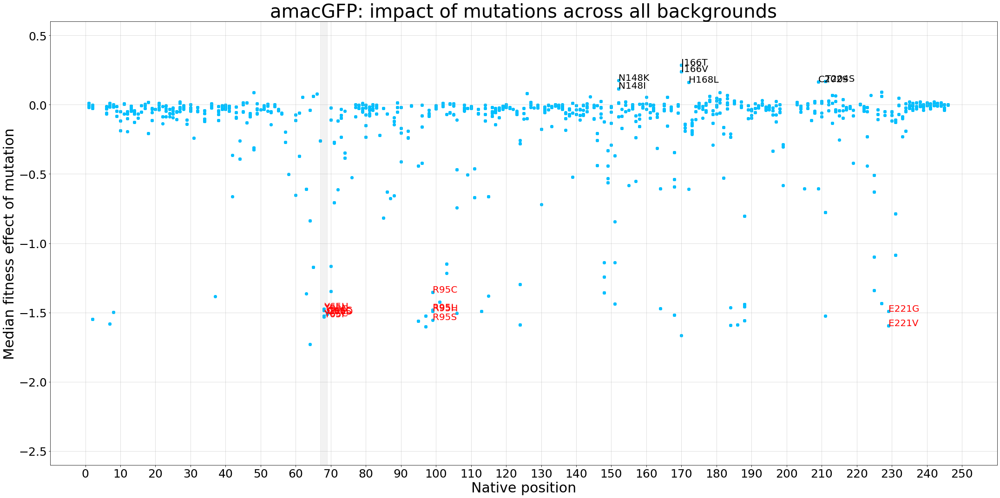

In [81]:
fig, ax = plt.subplots(figsize=(30,15))

ax.scatter('position', 'median', data=dfNew_finally, c='deepskyblue', s=30)
#ax.text('position', 'median', 'mutation', data=dfNew_fin, ha='left', color='grey', fontsize=10)
dfNew_annot_final[['position', 'median', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=20), axis=1)
dfNew_annot_kill[['position', 'median', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=20,color='red'), axis=1)

ax.set_ylabel('Median fitness effect of mutation', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('amacGFP: impact of mutations across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.set_yticks(np.arange(-2.5, 1, step=0.5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_ylim(ymin=-2.6, ymax=0.6)
ax.set_xlim(xmin=-10,xmax=260)
plt.axvspan(67, 69, color='gray', alpha=0.1)


fig.tight_layout()

plt.savefig('amac_median_impact_scat_final.png', dpi=300)

In [56]:
killing_mut = ['R95', 'Y65', 'G66', 'E221']

dfNew_annot_kill = dfNew_threshold[dfNew_threshold['native_mutation'].str.contains(r'R95|Y65|G66|E221')]
dfNew_annot_kill = dfNew_annot_kill[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_kill=dfNew_annot_kill.drop_duplicates('mutation')
dfNew_annot_kill=dfNew_annot_kill.sort_values(by=['position'])
dfNew_annot_kill

,position,median,mutation,native_mutation
13245,68,-0.75,Y68C,Y65C
18156,68,-0.75,Y68H,Y65H
2852,68,-0.75,Y68N,Y65N
5234,68,-0.75,Y68F,Y65F
6181,69,-0.75,G69D,G66D
22346,69,-0.75,G69C,G66C
4634,69,-0.75,G69S,G66S
16413,99,-0.75,R99L,R95L
20,99,-0.75,R99H,R95H
141,99,-0.75,R99S,R95S


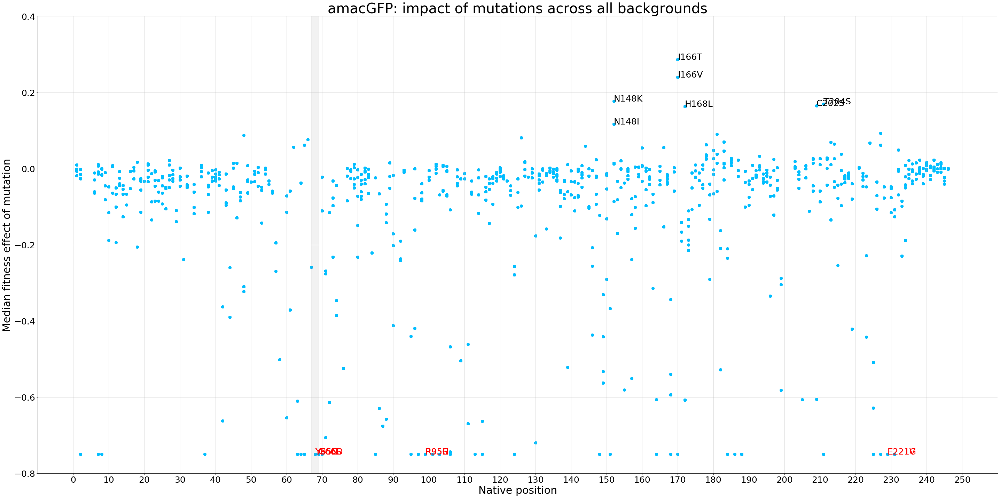

In [57]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'median', data=dfNew_threshold, c='deepskyblue', s=60)
#ax.text('position', 'median', 'mutation', data=dfNew_fin, ha='left', color='grey', fontsize=10)
dfNew_annot_thres[['position', 'median', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)
dfNew_annot_kill[['position', 'median', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25,color='red'), axis=1)

ax.set_ylabel('Median fitness effect of mutation', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('amacGFP: impact of mutations across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.set_yticks(np.arange(-0.8, 0.6, step=0.2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_ylim(ymin=-0.8, ymax=0.4)
ax.set_xlim(xmin=-10,xmax=260)
plt.axvspan(67, 69, color='gray', alpha=0.1)


fig.tight_layout()

plt.savefig('amac_median_impact_scat_thres.png', dpi=300)

In [58]:
x = dfNew_annot_thres.mutation.to_string(header=False,
                  index=False).split('\n')
vals = '|'.join(x)
print(vals)

 N152K| N152I| I170T| I170V| H172L| C209S| T211S


In [75]:
dfNew_annot_kill_final = dfNew_finally[dfNew_finally['native_mutation'].str.contains(r'R95|Y65|G66|E221')]
dfNew_annot_kill_final = dfNew_annot_kill_final[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_kill_final=dfNew_annot_kill_final.drop_duplicates('mutation')
dfNew_annot_kill_final=dfNew_annot_kill_final.sort_values(by=['position'])

dfNew_annot_kill_thres = dfNew_threshold[dfNew_threshold['native_mutation'].str.contains(r'R95|Y65|G66|E221')]
dfNew_annot_kill_thres = dfNew_annot_kill_thres[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_kill_thres=dfNew_annot_kill_thres.drop_duplicates('mutation')
dfNew_annot_kill_thres=dfNew_annot_kill_thres.sort_values(by=['position'])

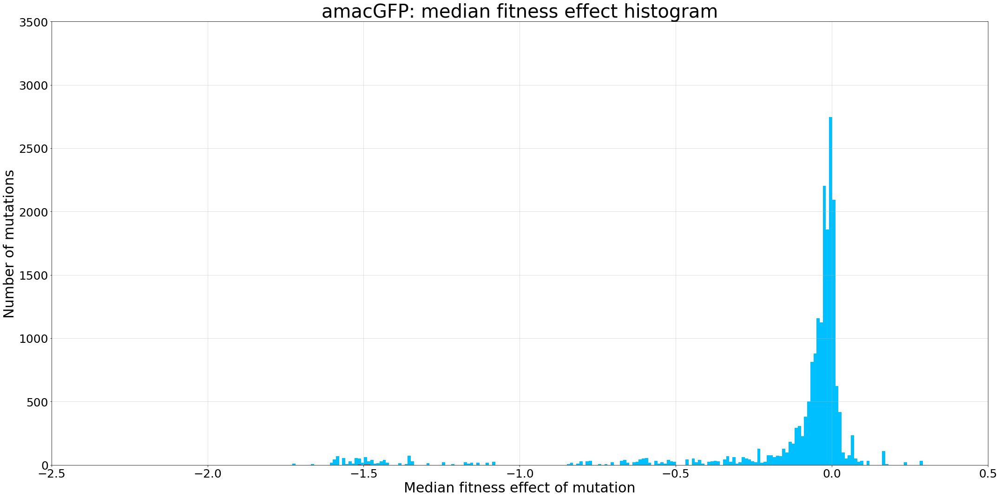

In [76]:
fig, ax = plt.subplots(figsize=(30,15))
data=dfNew_finally['median']
data1=dfNew_annot_kill_final['median']
ax.hist(data, bins=np.arange(min(data), max(data) + 0.01, 0.01), color='deepskyblue')
ax.hist(data1, bins=np.arange(min(data), max(data) + 0.01, 0.01), color='red')
ax.set_xlabel('Median fitness effect of mutation', fontsize=30)
ax.set_ylabel('Number of mutations', fontsize=30)
ax.set_title('amacGFP: median fitness effect histogram', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)
#ax.set_xticks(np.arange(-6.2, 1, step=0.2));
#ax.set_yticks(np.arange(0, 7500, step=500));
ax.grid(alpha=0.5)
#ax.set_xlim(xmin=-6, xmax=1)
#ax.set_ylim(ymax=7000)

ax.set_xticks(np.arange(-2.5, 1, step=0.5));
ax.set_yticks(np.arange(0, 4000, step=500));

fig.tight_layout()
plt.savefig('amac_median_impact_hist_final.png', dpi=300)

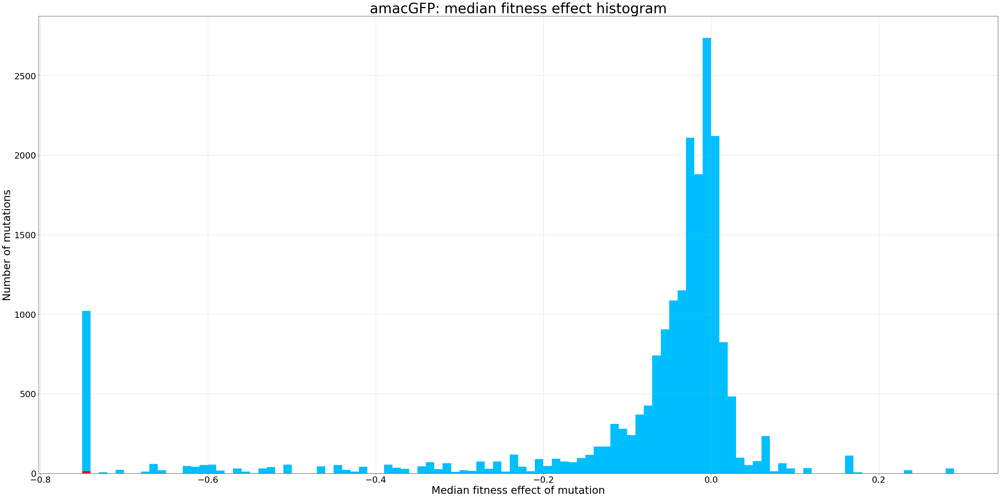

In [61]:
fig, ax = plt.subplots(figsize=(40,20))
data=dfNew_threshold['median']
ax.hist(data, bins=np.arange(min(data), max(data) + 0.01, 0.01), color='deepskyblue')
data1=dfNew_annot_kill_thres['median']
ax.hist(data1, bins=np.arange(min(data), max(data) + 0.01, 0.01), color='red')
ax.set_xlabel('Median fitness effect of mutation', fontsize=30)
ax.set_ylabel('Number of mutations', fontsize=30)
ax.set_title('amacGFP: median fitness effect histogram', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)
#ax.set_xticks(np.arange(-0.8, 0.9, step=0.2));
#ax.set_yticks(np.arange(0, 7500, step=500));
ax.grid(alpha=0.5)
#ax.set_xlim(xmin=-0.8)
#ax.set_ylim(ymax=7000)

fig.tight_layout()
plt.savefig('amac_median_impact_hist_thres.png', dpi=300)

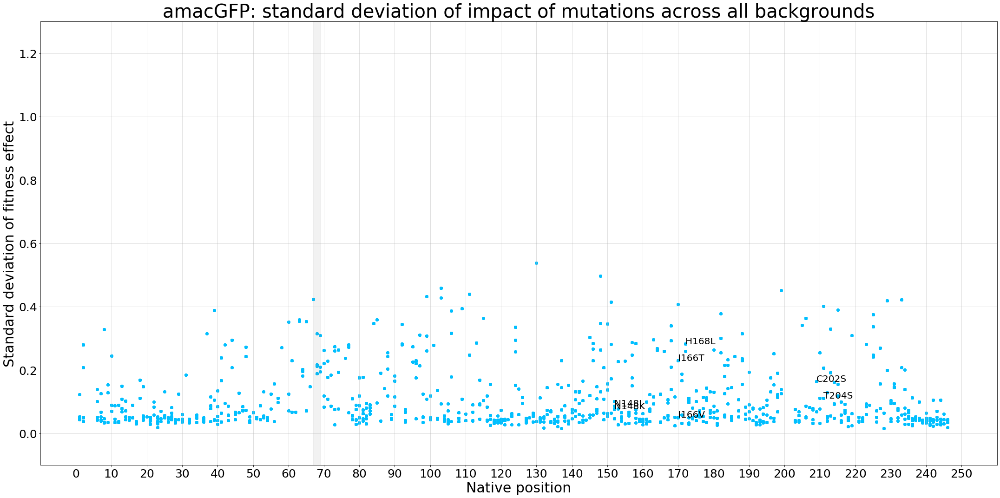

In [77]:
fig, ax = plt.subplots(figsize=(30,15))

ax.scatter('position', 'stdev', data=dfNew_finally, c='deepskyblue', s=30)
dfNew_text_final[['position', 'stdev', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=20), axis=1)

ax.set_ylabel('Standard deviation of fitness effect', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('amacGFP: standard deviation of impact of mutations across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.set_yticks(np.arange(0, 1.4, step=0.2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_xlim(xmin=-10,xmax=260)
ax.set_ylim(ymin=-0.1,ymax=1.3)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()
plt.savefig('amac_stdev_scat_final.png', dpi=300)

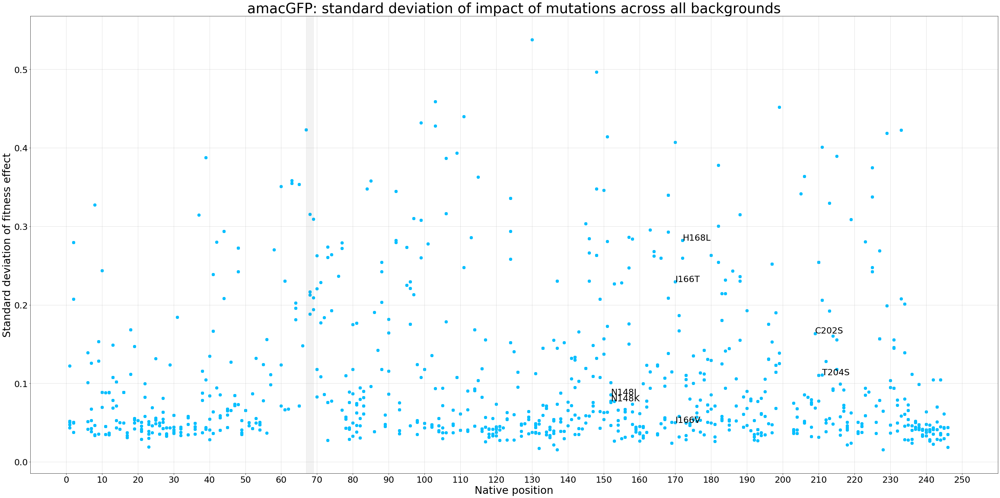

In [73]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'stdev', data=dfNew_threshold, c='deepskyblue', s=60)
dfNew_text_thres[['position', 'stdev', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)

ax.set_ylabel('Standard deviation of fitness effect', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('amacGFP: standard deviation of impact of mutations across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
#ax.set_yticks(np.arange(-0.2, 2.8, step=0.2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_xlim(xmin=-10,xmax=260)
#ax.set_ylim(ymin=-0.1,ymax=2.6)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()
plt.savefig('amac_stdev_scat_thres.png', dpi=300)

In [74]:
dfNew_finally['ben_vs_del'] = dfNew_finally['bright_context']
dfNew_threshold['ben_vs_del'] = dfNew_threshold['bright_context']

In [75]:
dfNew_finally['ben_vs_del'].values[dfNew_finally['ben_vs_del'] > 0] = 1
dfNew_finally['ben_vs_del'].values[dfNew_finally['ben_vs_del'] < 0] = 0

dfNew_threshold['ben_vs_del'].values[dfNew_threshold['ben_vs_del'] > 0] = 1
dfNew_threshold['ben_vs_del'].values[dfNew_threshold['ben_vs_del'] < 0] = 0

In [76]:
dfNew_threshold['comparison']=""

for index, row in dfNew_threshold.iterrows():
    pos = row['mutation']
    dfNew_threshold['comparison'][index] = dfNew_threshold[dfNew_threshold['mutation']==pos].ben_vs_del.sum()

dfNew_threshold = dfNew_threshold.sort_values(['median'],ascending=False)
dfNew_threshold

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,position,bright_context,median,mutation,bac_num,stdev,native_mutation,ben_vs_del,comparison
2375,170,0.330227,0.285801,I170T,31,0.229443,I166T,1.0,29
1122,170,-0.396572,0.285801,I170T,31,0.229443,I166T,0.0,29
18680,170,0.346446,0.285801,I170T,31,0.229443,I166T,1.0,29
10861,170,0.298253,0.285801,I170T,31,0.229443,I166T,1.0,29
7342,170,0.329910,0.285801,I170T,31,0.229443,I166T,1.0,29
...,...,...,...,...,...,...,...,...,...
16907,64,-1.763837,-0.75,T64N,9,0.181266,T61N,0.0,0
3681,64,-1.500399,-0.75,T64N,9,0.181266,T61N,0.0,0
11499,64,-1.660510,-0.75,T64N,9,0.181266,T61N,0.0,0
11236,64,-1.354093,-0.75,T64N,9,0.181266,T61N,0.0,0


In [77]:
dfNew_finally['comparison']=""

for index, row in dfNew_finally.iterrows():
    pos = row['mutation']
    dfNew_finally['comparison'][index] = dfNew_finally[dfNew_finally['mutation']==pos].ben_vs_del.sum()

dfNew_finally = dfNew_finally.sort_values(['median'],ascending=False)
dfNew_finally

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,position,bright_context,median,mutation,bac_num,stdev,native_mutation,ben_vs_del,comparison
2375,170,0.330227,0.285801,I170T,31,0.229443,I166T,1.0,29
1122,170,-0.396572,0.285801,I170T,31,0.229443,I166T,0.0,29
18680,170,0.346446,0.285801,I170T,31,0.229443,I166T,1.0,29
10861,170,0.298253,0.285801,I170T,31,0.229443,I166T,1.0,29
7342,170,0.329910,0.285801,I170T,31,0.229443,I166T,1.0,29
...,...,...,...,...,...,...,...,...,...
11236,64,-1.354093,-1.72861,T64N,9,0.181266,T61N,0.0,0
9930,64,-1.567020,-1.72861,T64N,9,0.181266,T61N,0.0,0
22584,64,-1.949999,-1.72861,T64N,9,0.181266,T61N,0.0,0
21805,64,-1.728615,-1.72861,T64N,9,0.181266,T61N,0.0,0


In [78]:
#Another way of doing it
#position=dfNew_perc['mutation']
#comp_pos = {}
#for pos in position:
    #posit = dfNew_perc[dfNew_perc['mutation']== pos]
    #comp_pos[pos] = posit['ben_vs_del'].sum()
    
#comp_pos = pd.DataFrame.from_dict(comp_pos, orient='index')
#comp_pos.columns =['comparison']
#comp_pos = comp_pos.rename_axis('mutation').reset_index()
#dfNew_comp= pd.merge(dfNew_perc, comp_pos, on='mutation')

In [79]:
#dfNew_comp['ones']=1
#position=dfNew_comp['mutation']
#sum_pos = {}
#for pos in position:
    #posit = dfNew_comp[dfNew_comp['mutation']== pos]
    #sum_pos[pos] = posit['ones'].sum()
    
#sum_pos = pd.DataFrame.from_dict(sum_pos, orient='index')
#sum_pos.columns =['total']
#sum_pos = sum_pos.rename_axis('mutation').reset_index()
#dfNew_total= pd.merge(dfNew_comp, sum_pos, on='mutation')
#dfNew_comp =dfNew_comp.dropna()
dfNew_finally['percentage']=dfNew_finally['comparison']/dfNew_finally['bac_num']
dfNew_threshold['percentage']=dfNew_threshold['comparison']/dfNew_threshold['bac_num']

In [80]:
dfNew_finally = dfNew_finally.rename(columns={'percentage': 'ben_percentage'})
dfNew_finally['del_percentage']=1-dfNew_finally['ben_percentage']

dfNew_threshold = dfNew_threshold.rename(columns={'percentage': 'ben_percentage'})
dfNew_threshold['del_percentage']=1-dfNew_threshold['ben_percentage']

In [81]:
dfNew_finally=dfNew_finally.sort_values(by=['ben_percentage'])
dfNew_threshold=dfNew_threshold.sort_values(by=['ben_percentage'])

In [82]:
dfNew_tag_final=dfNew_finally.loc[dfNew_finally['median']>0.1]
dfNew_tag_final=dfNew_tag_final.drop_duplicates('mutation')
dfNew_tag_final=dfNew_tag_final.sort_values(by=['position'])

dfNew_tag_thres=dfNew_threshold.loc[dfNew_threshold['median']>0.1]
dfNew_tag_thres=dfNew_tag_thres.drop_duplicates('mutation')
dfNew_tag_thres=dfNew_tag_thres.sort_values(by=['position'])

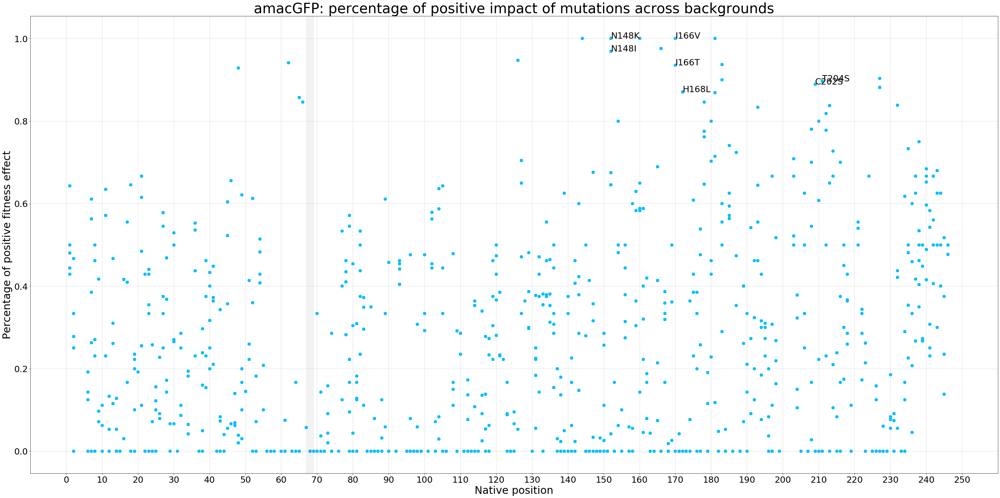

In [83]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'ben_percentage', data=dfNew_finally, c='deepskyblue', s=60)
dfNew_tag_final[['position', 'ben_percentage', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)

ax.set_ylabel('Percentage of positive fitness effect', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('amacGFP: percentage of positive impact of mutations across backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_xlim(xmin=-10,xmax=260)
#ax.set_ylim(ymin=-0.1,ymax=1.1)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()
plt.savefig('amac_percentage_scat_final.png', dpi=300)

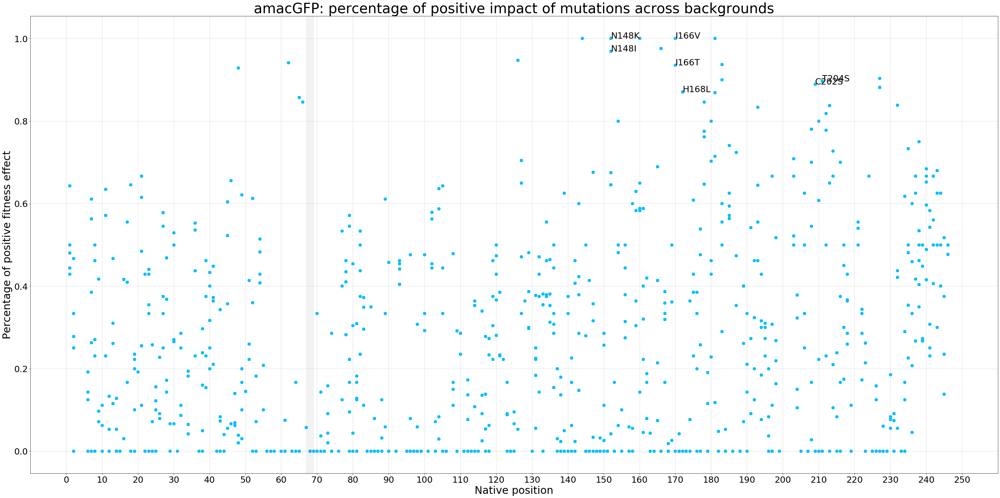

In [84]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'ben_percentage', data=dfNew_threshold, c='deepskyblue', s=60)
dfNew_tag_thres[['position', 'ben_percentage', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)

ax.set_ylabel('Percentage of positive fitness effect', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('amacGFP: percentage of positive impact of mutations across backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_xlim(xmin=-10,xmax=260)
#ax.set_ylim(ymin=-0.1,ymax=1.1)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()
plt.savefig('amac_percentage_scat_thres.png', dpi=300)

In [85]:
dfNew_finally=dfNew_finally.astype({'median': 'float64','bac_num': 'int64','stdev': 'float64','comparison': 'float64','ben_percentage': 'float64','del_percentage': 'float64'})
dfNew_threshold=dfNew_threshold.astype({'median': 'float64','bac_num': 'int64','stdev': 'float64','comparison': 'float64','ben_percentage': 'float64','del_percentage': 'float64'})

In [86]:
dfNew_finally.dtypes

position             int64
bright_context     float64
median             float64
mutation            object
bac_num              int64
stdev              float64
native_mutation     object
ben_vs_del         float64
comparison         float64
ben_percentage     float64
del_percentage     float64
dtype: object

In [87]:
to_plot_final=dfNew_finally.groupby('mutation').ben_percentage.agg(np.mean).sort_values()
to_plot_thres=dfNew_threshold.groupby('mutation').ben_percentage.agg(np.mean).sort_values()

In [88]:
dfNew_finally.to_csv('amac_percentage_final.csv')
dfNew_threshold.to_csv('amac_percentage_thres.csv')

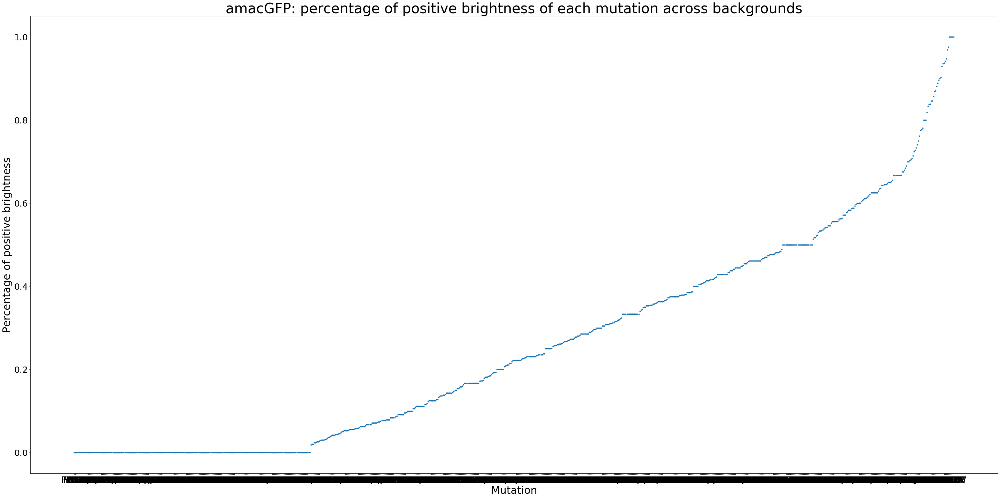

In [89]:
fig, ax = plt.subplots(figsize=(40,20))

ax.plot(to_plot_final, '.')

ax.set_ylabel('Percentage of positive brightness', fontsize=30)
ax.set_xlabel('Mutation', fontsize=30)
ax.set_title('amacGFP: percentage of positive brightness of each mutation across backgrounds', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)



fig.tight_layout()
#plt.savefig('amac_bright_percentage_pseudo.png', dpi=300)

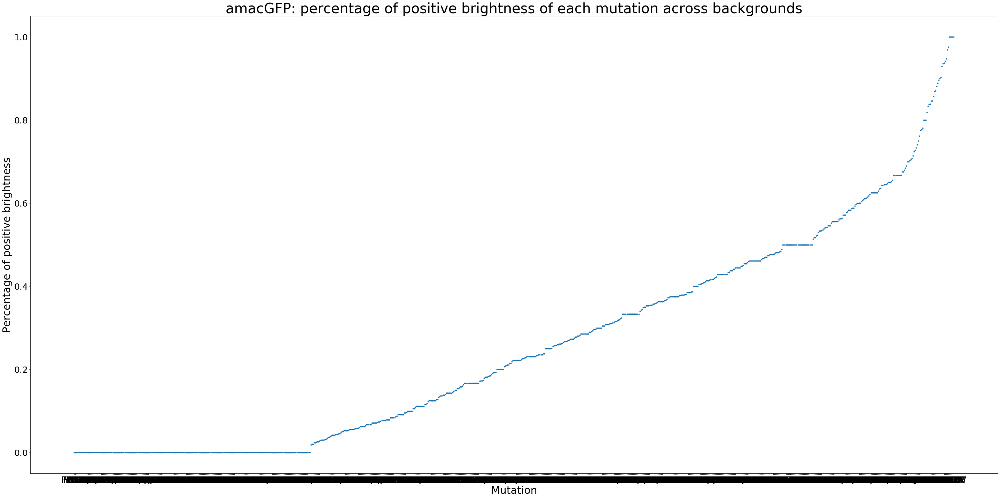

In [90]:
fig, ax = plt.subplots(figsize=(40,20))

ax.plot(to_plot_thres, '.')

ax.set_ylabel('Percentage of positive brightness', fontsize=30)
ax.set_xlabel('Mutation', fontsize=30)
ax.set_title('amacGFP: percentage of positive brightness of each mutation across backgrounds', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)



fig.tight_layout()
#plt.savefig('amac_bright_percentage_pseudo.png', dpi=300)

In [91]:
to_plot_final=dfNew_finally.groupby('mutation')[['median', 'stdev']].agg(np.mean)
to_plot_final['variance']=to_plot_final['stdev']*to_plot_final['stdev']
to_plot_final['index_disp']=(to_plot_final['variance']*to_plot_final['variance'])/to_plot_final['stdev']
to_plot_final

,median,stdev,variance,index_disp
mutation,,,,
*246G,-0.001390,0.043913,0.001928,0.000085
*246R,0.000094,0.035006,0.001225,0.000043
*246W,0.000426,0.018704,0.000350,0.000007
A160D,0.006331,0.061851,0.003826,0.000237
A160P,0.054262,0.035766,0.001279,0.000046
...,...,...,...,...
Y68H,-1.475746,0.216559,0.046898,0.010156
Y68N,-1.485714,0.188329,0.035468,0.006680
Y76F,-0.524246,0.236498,0.055931,0.013228


In [92]:
to_plot_thres=dfNew_threshold.groupby('mutation')[['median', 'stdev']].agg(np.mean)
to_plot_thres['variance']=to_plot_thres['stdev']*to_plot_thres['stdev']
to_plot_thres['index_disp']=(to_plot_thres['variance']*to_plot_thres['variance'])/to_plot_thres['stdev']
to_plot_thres

,median,stdev,variance,index_disp
mutation,,,,
*246G,-0.001390,0.043913,0.001928,0.000085
*246R,0.000094,0.035006,0.001225,0.000043
*246W,0.000426,0.018704,0.000350,0.000007
A160D,0.006331,0.061851,0.003826,0.000237
A160P,0.054262,0.035766,0.001279,0.000046
...,...,...,...,...
Y68H,-0.750000,0.216559,0.046898,0.010156
Y68N,-0.750000,0.188329,0.035468,0.006680
Y76F,-0.524246,0.236498,0.055931,0.013228


In [93]:
to_plot_final.to_csv('amac_median_final.csv')
to_plot_thres.to_csv('amac_median_thres.csv')

In [94]:
to_annotate_final = to_plot_final.loc[to_plot_final['variance']>0.05]
to_annotate_final = to_annotate_final.rename_axis('mutation').reset_index()

to_annotate_thres = to_plot_thres.loc[to_plot_thres['variance']>0.05]
to_annotate_thres = to_annotate_thres.rename_axis('mutation').reset_index()

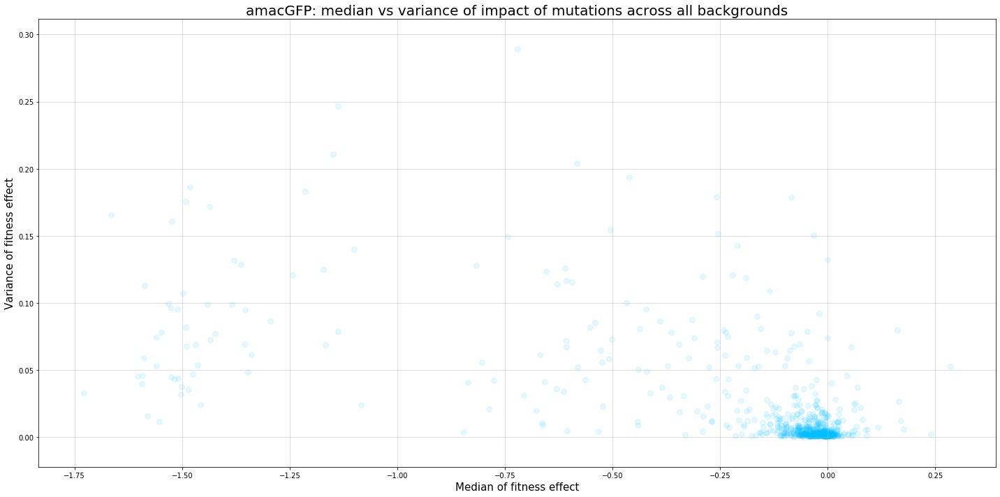

In [95]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('median','variance', data=to_plot_final, c='deepskyblue', s=60, alpha=0.1)
#to_annotate[['median', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);


ax.set_ylabel('Variance of fitness effect', fontsize=15)
ax.set_xlabel('Median of fitness effect', fontsize=15)
ax.set_title('amacGFP: median vs variance of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1, step=0.5));
#ax.set_yticks(np.arange(0,6, step=0.5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6,xmax=1)
#ax.set_ylim(ymin=-0.1)

fig.tight_layout()
plt.savefig('amac_median_var_final.png', dpi=300)

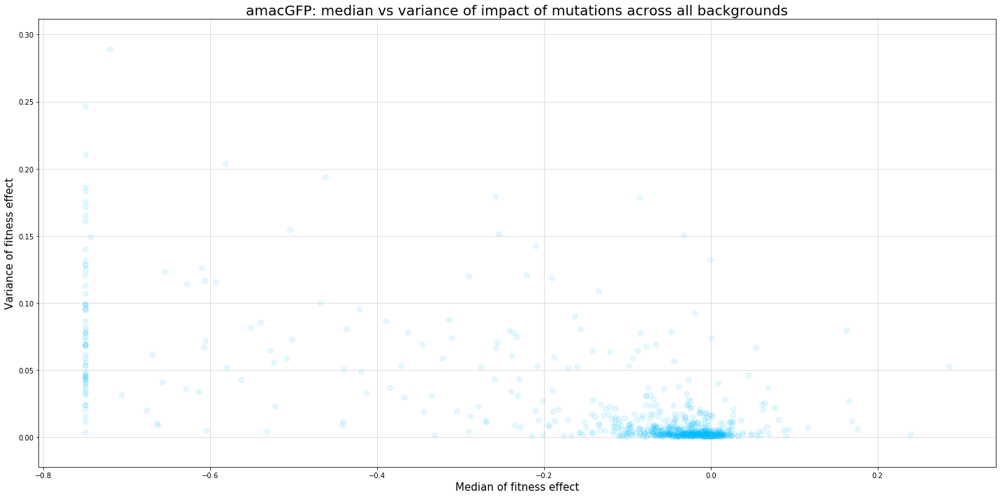

In [96]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('median','variance', data=to_plot_thres, c='deepskyblue', s=60, alpha=0.1)
#to_annotate[['median', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);


ax.set_ylabel('Variance of fitness effect', fontsize=15)
ax.set_xlabel('Median of fitness effect', fontsize=15)
ax.set_title('amacGFP: median vs variance of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-0.8,0.9, step=0.1));
#ax.set_yticks(np.arange(0,6, step=0.5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-0.8,xmax=0.8)
#ax.set_ylim(ymin=-0.1)

fig.tight_layout()
plt.savefig('amac_median_var_thres.png', dpi=300)

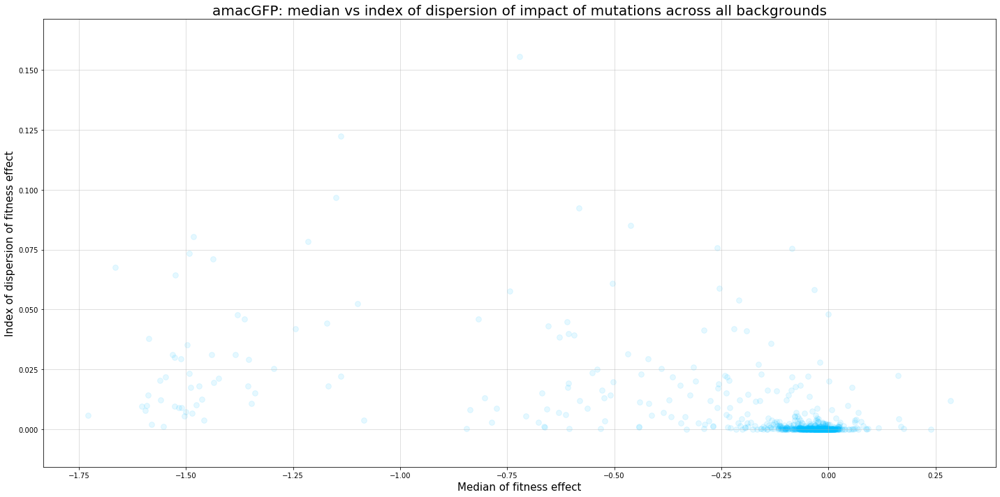

In [97]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('median','index_disp', data=to_plot_final, c='deepskyblue', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Index of dispersion of fitness effect', fontsize=15)
ax.set_xlabel('Median of fitness effect', fontsize=15)
ax.set_title('amacGFP: median vs index of dispersion of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-0.8,0.9, step=0.1));
#ax.set_yticks(np.arange(0,35, step=5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-0.8,xmax=0.8)
#ax.set_ylim(ymin=-0.5)


fig.tight_layout()
#plt.savefig('amac_median_ind_pseudo.png', dpi=300)

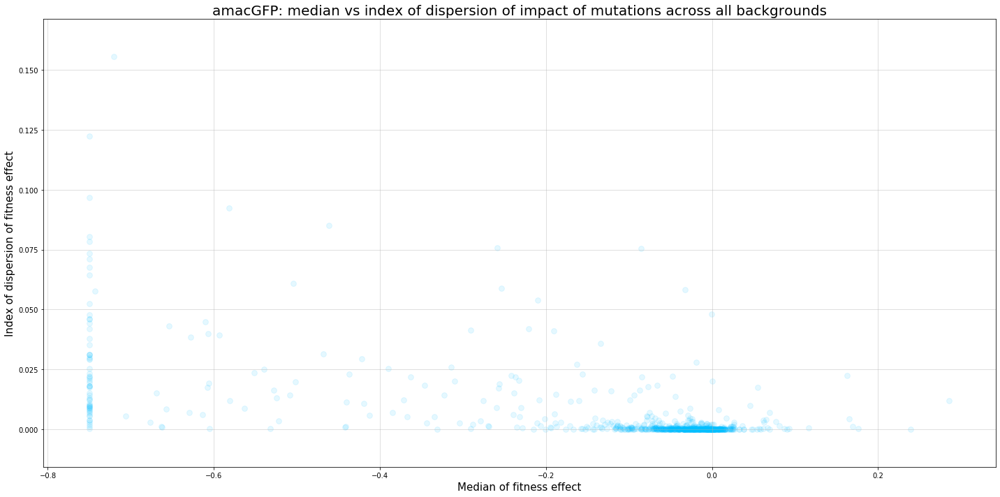

In [98]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('median','index_disp', data=to_plot_thres, c='deepskyblue', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Index of dispersion of fitness effect', fontsize=15)
ax.set_xlabel('Median of fitness effect', fontsize=15)
ax.set_title('amacGFP: median vs index of dispersion of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-0.8,0.9, step=0.1));
#ax.set_yticks(np.arange(0,35, step=5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-0.8,xmax=0.8)
#ax.set_ylim(ymin=-0.5)


fig.tight_layout()
#plt.savefig('amac_median_ind_pseudo.png', dpi=300)

In [99]:
dfNew_finally['mean']=""

for index, row in dfNew_finally.iterrows():
    pos = row['mutation']
    dfNew_finally['mean'][index] = dfNew_finally[dfNew_finally['mutation']==pos].bright_context.mean()

dfNew_finally = dfNew_finally.sort_values(['median'],ascending=False)
dfNew_finally

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,position,bright_context,median,mutation,bac_num,stdev,native_mutation,ben_vs_del,comparison,ben_percentage,del_percentage,mean
9600,170,0.280360,0.285801,I170T,31,0.229443,I166T,1.0,29.0,0.935484,0.064516,0.237177
235,170,0.376589,0.285801,I170T,31,0.229443,I166T,1.0,29.0,0.935484,0.064516,0.237177
2375,170,0.330227,0.285801,I170T,31,0.229443,I166T,1.0,29.0,0.935484,0.064516,0.237177
14398,170,0.301747,0.285801,I170T,31,0.229443,I166T,1.0,29.0,0.935484,0.064516,0.237177
2506,170,0.248738,0.285801,I170T,31,0.229443,I166T,1.0,29.0,0.935484,0.064516,0.237177
...,...,...,...,...,...,...,...,...,...,...,...,...
11499,64,-1.660510,-1.728615,T64N,9,0.181266,T61N,0.0,0.0,0.000000,1.000000,-1.68007
11236,64,-1.354093,-1.728615,T64N,9,0.181266,T61N,0.0,0.0,0.000000,1.000000,-1.68007
9930,64,-1.567020,-1.728615,T64N,9,0.181266,T61N,0.0,0.0,0.000000,1.000000,-1.68007
22584,64,-1.949999,-1.728615,T64N,9,0.181266,T61N,0.0,0.0,0.000000,1.000000,-1.68007


In [100]:
dfNew_threshold['mean']=""

for index, row in dfNew_threshold.iterrows():
    pos = row['mutation']
    dfNew_threshold['mean'][index] = dfNew_threshold[dfNew_threshold['mutation']==pos].bright_context.mean()

dfNew_threshold = dfNew_threshold.sort_values(['median'],ascending=False)
dfNew_threshold

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,position,bright_context,median,mutation,bac_num,stdev,native_mutation,ben_vs_del,comparison,ben_percentage,del_percentage,mean
9600,170,0.280360,0.285801,I170T,31,0.229443,I166T,1.0,29.0,0.935484,0.064516,0.237177
235,170,0.376589,0.285801,I170T,31,0.229443,I166T,1.0,29.0,0.935484,0.064516,0.237177
2375,170,0.330227,0.285801,I170T,31,0.229443,I166T,1.0,29.0,0.935484,0.064516,0.237177
14398,170,0.301747,0.285801,I170T,31,0.229443,I166T,1.0,29.0,0.935484,0.064516,0.237177
2506,170,0.248738,0.285801,I170T,31,0.229443,I166T,1.0,29.0,0.935484,0.064516,0.237177
...,...,...,...,...,...,...,...,...,...,...,...,...
19724,188,-0.791892,-0.750000,N188S,27,0.236263,N184S,0.0,0.0,0.000000,1.000000,-0.85666
13384,231,-0.786374,-0.750000,F231S,29,0.144785,F223S,0.0,0.0,0.000000,1.000000,-0.825818
5375,231,-0.780560,-0.750000,F231S,29,0.144785,F223S,0.0,0.0,0.000000,1.000000,-0.825818
12337,211,-0.758071,-0.750000,T211A,34,0.205969,T204A,0.0,0.0,0.000000,1.000000,-0.800864


In [101]:
#position=dfNew_total['mutation']
#mean_pos = {}
#for pos in position:
    #posit = dfNew_total[dfNew_total['mutation']== pos]
    #mean_pos[pos] = posit['bright_context'].mean()
    
#mean_pos = pd.DataFrame.from_dict(mean_pos, orient='index')
#mean_pos.columns =['mean']
#mean_pos = mean_pos.rename_axis('mutation').reset_index()
#dfNew_mean= pd.merge(dfNew_total, mean_pos, on='mutation')
#dfNew_mean

In [102]:
dfNew_finally=dfNew_finally.astype({'mean': 'float64'})
dfNew_threshold=dfNew_threshold.astype({'mean': 'float64'})

In [103]:
to_plot_final=dfNew_finally.groupby('mutation')[['mean', 'stdev']].agg(np.mean)
to_plot_final['variance']=to_plot_final['stdev']*to_plot_final['stdev']

to_plot_thres=dfNew_threshold.groupby('mutation')[['mean', 'stdev']].agg(np.mean)
to_plot_thres['variance']=to_plot_thres['stdev']*to_plot_thres['stdev']

In [104]:
to_plot_final.to_csv('amac_mean_final.csv')
to_plot_thres.to_csv('amac_mean_thres.csv')

In [105]:
to_annotate_final=to_plot_final.loc[to_plot_final['variance']>0.05]
to_annotate_final = to_annotate_final.rename_axis('mutation').reset_index()

to_annotate_thres=to_plot_thres.loc[to_plot_thres['variance']>0.05]
to_annotate_thres = to_annotate_thres.rename_axis('mutation').reset_index()

In [106]:
dfNew_finally.dtypes

position             int64
bright_context     float64
median             float64
mutation            object
bac_num              int64
stdev              float64
native_mutation     object
ben_vs_del         float64
comparison         float64
ben_percentage     float64
del_percentage     float64
mean               float64
dtype: object

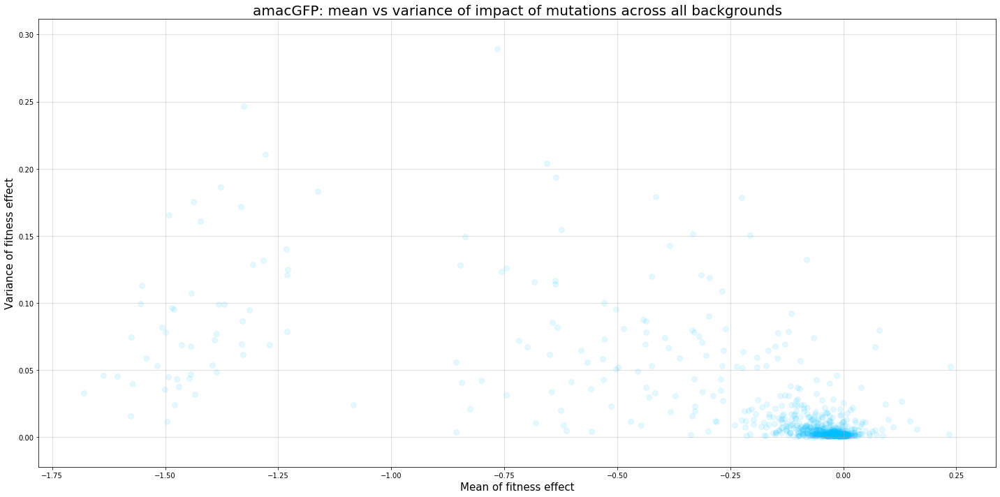

In [107]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('mean','variance', data=to_plot_final, c='deepskyblue', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Variance of fitness effect', fontsize=15)
ax.set_xlabel('Mean of fitness effect', fontsize=15)
ax.set_title('amacGFP: mean vs variance of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1.5, step=0.5));
#ax.set_yticks(np.arange(0,12, step=2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6)
#ax.set_ylim(ymin=-0.5)


fig.tight_layout()
#plt.savefig('amac_mean_var_pseudo.png', dpi=300)

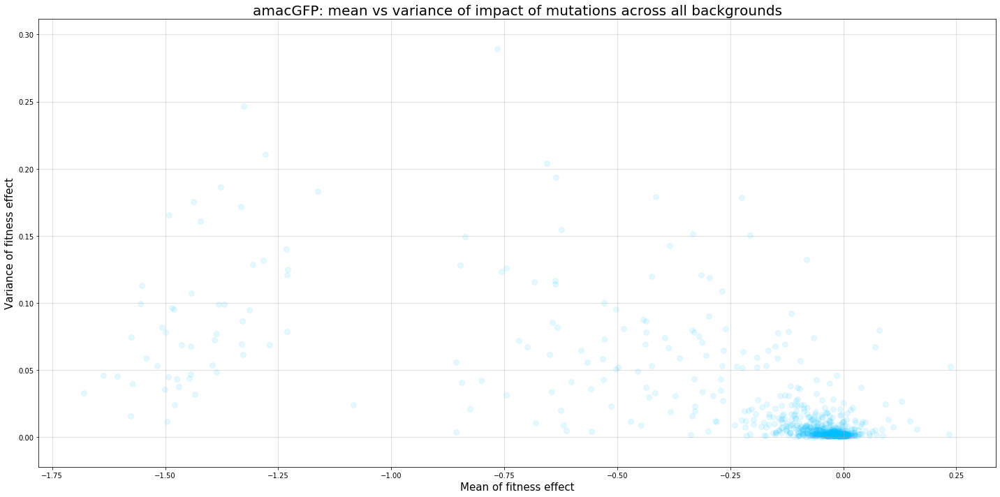

In [108]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('mean','variance', data=to_plot_thres, c='deepskyblue', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Variance of fitness effect', fontsize=15)
ax.set_xlabel('Mean of fitness effect', fontsize=15)
ax.set_title('amacGFP: mean vs variance of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1.5, step=0.5));
#ax.set_yticks(np.arange(0,12, step=2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6)
#ax.set_ylim(ymin=-0.5)


fig.tight_layout()
#plt.savefig('amac_mean_var_pseudo.png', dpi=300)

In [109]:
to_plot_final['index_disp']=(to_plot_final['variance']*to_plot_final['variance'])/to_plot_final['stdev']
to_plot_thres['index_disp']=(to_plot_thres['variance']*to_plot_thres['variance'])/to_plot_thres['stdev']

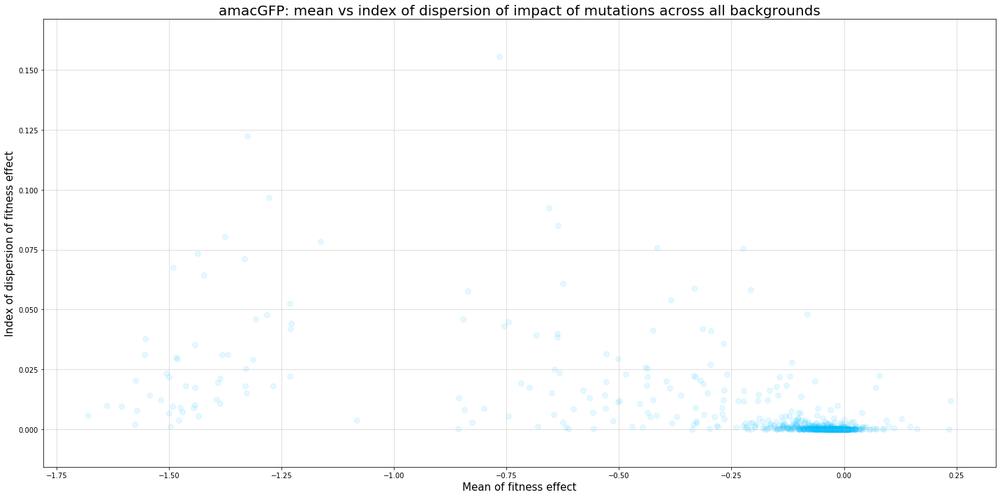

In [110]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('mean','index_disp', data=to_plot_final, c='deepskyblue', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Index of dispersion of fitness effect', fontsize=15)
ax.set_xlabel('Mean of fitness effect', fontsize=15)
ax.set_title('amacGFP: mean vs index of dispersion of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1.5, step=0.5));
#ax.set_yticks(np.arange(0,35, step=5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6)
#ax.set_ylim(ymin=-1)


fig.tight_layout()
#plt.savefig('amac_mean_ind_pseudo.png', dpi=300)

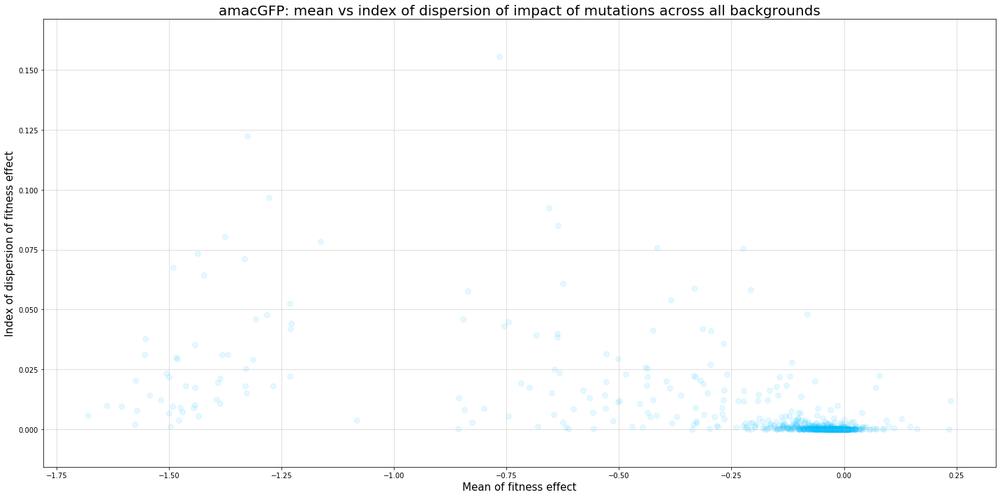

In [111]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('mean','index_disp', data=to_plot_thres, c='deepskyblue', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Index of dispersion of fitness effect', fontsize=15)
ax.set_xlabel('Mean of fitness effect', fontsize=15)
ax.set_title('amacGFP: mean vs index of dispersion of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1.5, step=0.5));
#ax.set_yticks(np.arange(0,35, step=5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6)
#ax.set_ylim(ymin=-1)


fig.tight_layout()
#plt.savefig('amac_mean_ind_pseudo.png', dpi=300)

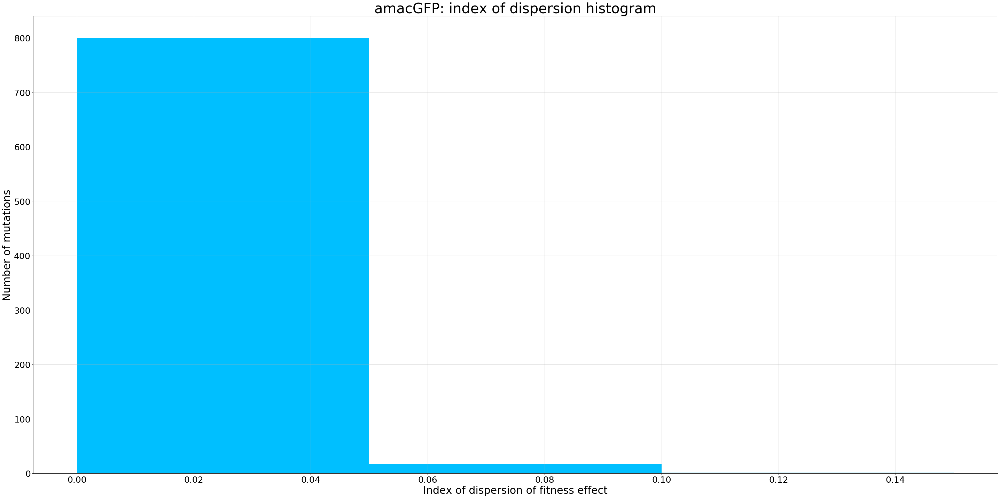

In [112]:
fig, ax = plt.subplots(figsize=(40,20))
data=to_plot_final['index_disp']
ax.hist(data, bins=np.arange(min(data), max(data) + 0.01, 0.05), color='deepskyblue')
ax.set_xlabel('Index of dispersion of fitness effect', fontsize=30)
ax.set_ylabel('Number of mutations', fontsize=30)
ax.set_title('amacGFP: index of dispersion histogram', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)
#ax.set_xticks(np.arange(0, 16, step=1));
#ax.set_yticks(np.arange(0,900, step=100));
ax.grid(alpha=0.5)
#ax.set_xlim(xmin=-0.1)
#ax.set_ylim(ymax=800)

fig.tight_layout()
#plt.savefig('amac_ind_hist_pseudo.png', dpi=300)

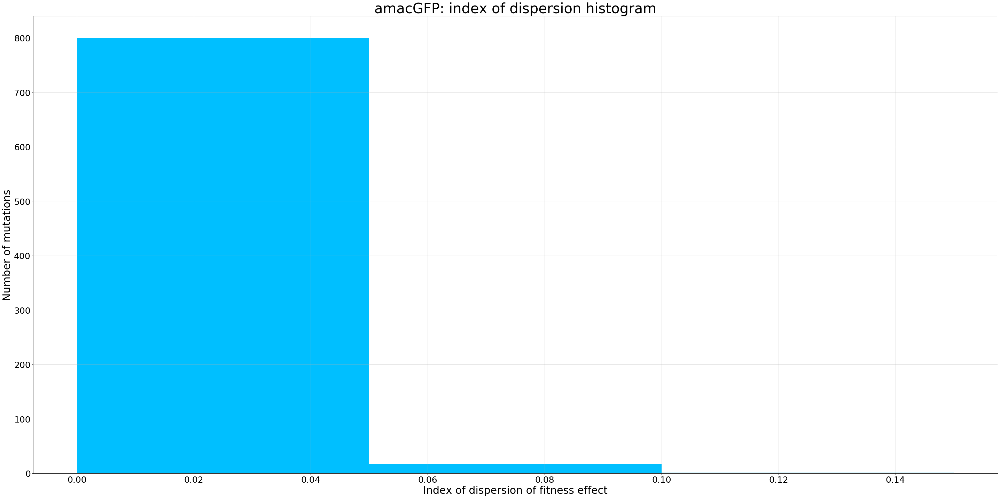

In [113]:
fig, ax = plt.subplots(figsize=(40,20))
data=to_plot_thres['index_disp']
ax.hist(data, bins=np.arange(min(data), max(data) + 0.01, 0.05), color='deepskyblue')
ax.set_xlabel('Index of dispersion of fitness effect', fontsize=30)
ax.set_ylabel('Number of mutations', fontsize=30)
ax.set_title('amacGFP: index of dispersion histogram', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)
#ax.set_xticks(np.arange(0, 16, step=1));
#ax.set_yticks(np.arange(0,900, step=100));
ax.grid(alpha=0.5)
#ax.set_xlim(xmin=-0.1)
#ax.set_ylim(ymax=800)

fig.tight_layout()
#plt.savefig('amac_ind_hist_pseudo.png', dpi=300)

In [114]:
to_plot_final.to_csv('amac_values_final.csv')
to_plot_thres.to_csv('amac_values_thres.csv')